In [349]:
import json
import matplotlib.pyplot as plt
import math
import numpy as np
import pandas as pd
import os
import seaborn as sns

In [350]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Notebook for the normalization and distance calculation between the landmarks

In [718]:
#Dictionary indicating the index for each bodypart
BODY_POINTS = {
    "Nose":  0,
    "LEyeIn": 1,
    "LEye": 2,
    "LEyeOut": 3,
    "REyeIn": 4,
    "REye": 5,
    "REyeOut": 6,
    "LEar": 7,
    "REar": 8,
    "LMouth": 9,
    "RMouth": 10,
    "LShoulder": 11,
    "RShoulder": 12,
    "LElbow": 13,
    "RElbow": 14,
    "LWrist": 15,
    "RWrist": 16,
    "LPinky": 17,
    "RPinky": 18,
    "LIndex": 19,
    "RIndex": 20,
    "LThumb": 21,
    "RThumb": 22,
    "LHip": 23,
    "RHip": 24,
    "LKnee": 25,
    "RKnee": 26,
    "LAnkle": 27,
    "RAnkle": 28,
    "LHeel": 29,
    "RHeel": 30,
    "LFoot": 31,
    "RFoot": 32
    }

In [719]:
def load_json(folder, filename):
    filepath = os.path.join(folder, filename)
    dict_list = []
    with open(filepath) as json_file:
        data = json.load(json_file)
    for key, value in data.items():
        dict_list.append(value)
    return dict_list

In [720]:
def dict_to_array(dictionary):
    array = []
    for key, value in dictionary.items():
        array.append(value)
    return np.array(array)

In [721]:
def calculate_body_angle(coordinates, body_part1, body_part2):
    coordinates = coordinates[:, :2].copy()
    a = coordinates[BODY_POINTS[body_part1]]
    b = coordinates[BODY_POINTS[body_part2]]
    c = np.array([b[0],a[1]])
    vector = np.subtract(b,a)
    v1 = np.subtract(b,a)
    v2 = np.subtract(c,a)
    dot = v1.dot(v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    angle_rad = np.arccos(dot/(norm_v1*norm_v2))
    return math.degrees(angle_rad)

In [722]:
def get_pose_center(coordinates):
    '''Calculate the centre of the pose, define as the midpoint between point the neck and the mid hip'''
    mid_hip = (coordinates[BODY_POINTS['LHip']] + coordinates[BODY_POINTS['RHip']])/2
    neck = (coordinates[BODY_POINTS['LShoulder']] + coordinates[BODY_POINTS['RShoulder']])/2
    center = (mid_hip + neck)/2
    return center

In [723]:
def get_distance(coordinates, body_part1, body_part2, dimensions = '2D'):
    '''Calculates the distance between two body parts'''
    if dimensions == '2D':
        coordinates = coordinates[:, :2].copy()
    bp1 = coordinates[BODY_POINTS[body_part1]]
    bp2 = coordinates[BODY_POINTS[body_part2]]
    distance = ((bp1-bp2)*(bp1-bp2)).sum() ** 0.5
    return distance

In [724]:
def get_pose_size(coordinates, torso_size_multiplier=2):
    """Calculates pose size.
    It is the maximum of two values:
      * Torso size multiplied by `torso_size_multiplier`
      * Maximum distance from pose center to any pose landmark
    """
    # This approach uses only 2D landmarks to compute pose size.
    coordinates = coordinates[:, :2].copy()

    # Hips center.
    left_hip = coordinates[BODY_POINTS['LHip']]
    right_hip = coordinates[BODY_POINTS['RHip']]
    hips = (left_hip + right_hip) * 0.5

    # Shoulders center.
    left_shoulder = coordinates[BODY_POINTS['LShoulder']]
    right_shoulder = coordinates[BODY_POINTS['RShoulder']]
    shoulders = (left_shoulder + right_shoulder) * 0.5

    # Torso size as the minimum body size.
    torso_size = np.linalg.norm(shoulders - hips)

    # Max dist to pose center.
    pose_center = get_pose_center(coordinates)
    max_dist = np.max(np.linalg.norm(coordinates - pose_center, axis=1))

    return max(torso_size * torso_size_multiplier, max_dist)

In [725]:
def normalize_pose_landmarks(coordinates, torso_size_multiplier=2):
    """Normalizes landmarks translation and scale."""

    norm_coordinates = coordinates.copy()
    
    # Normalize translation.
    pose_center = get_pose_center(norm_coordinates)
    norm_coordinates -= pose_center

    # Normalize scale.
    pose_size = get_pose_size(norm_coordinates, torso_size_multiplier)
    norm_coordinates /= pose_size
    # Multiplication by 100 is not required, but makes it eaasier to debug.
    norm_coordinates *= 100

    return norm_coordinates

In [726]:
def get_angle(coordinates, body_part1, body_part2, body_part3, dimensions = '2D'):
    '''Calculates the angle between three body parts'''
    if dimensions == '2D':
        coordinates = coordinates[:, :2].copy()
    a = coordinates[BODY_POINTS[body_part1]]
    b = coordinates[BODY_POINTS[body_part2]]
    c = coordinates[BODY_POINTS[body_part3]]
    v1 = np.subtract(a,b)
    v2 = np.subtract(c,b)
    dot = v1.dot(v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    angle_rad = np.arccos(dot/(norm_v1*norm_v2))
    return math.degrees(angle_rad)

In [727]:
def calculate_pairwise_distances(coordinates, torso_size_multiplier=2):
    '''Calculates a set of distances for a coordinate system'''
    pairs = [('LShoulder', 'LWrist'), ('RShoulder', 'RWrist'), ('RHip', 'RAnkle'), ('LHip', 'LAnkle'), ('RWrist', 'LWrist'),
             ('LAnkle', 'RAnkle'), ('RHip', 'RWrist'), ('LHip', 'LWrist'), ('LWrist', 'LAnkle'), ('RWrist', 'RAnkle'), 
             ('RKnee', 'LKnee'), ('RHip', 'LKnee'), ('LHip', 'RKnee')]
    
    distances_list = []
    
    for pair in pairs:
        norm_coordinates = normalize_pose_landmarks(coordinates)
        distance = round(get_distance(norm_coordinates, pair[0], pair[1]),2)
        distances_list.append(distance)
        
    return distances_list


In [728]:
def calculate_set_of_angles(coordinates):
    '''Calculates a set of angles for a coordinates system'''
    joints = [('LShoulder', 'LElbow', 'LWrist'), ('RShoulder', 'RElbow', 'RWrist'), ('LShoulder', 'LHip', 'LKnee'),
              ('RShoulder', 'RHip', 'RKnee'), ('LHip', 'LKnee', 'LAnkle'), ('RHip', 'RKnee', 'RAnkle')]
    angles_list = []
    for joint in joints:
        angle = round(get_angle(coordinates, joint[0], joint[1], joint[2]),2)
        angles_list.append(angle)
    return angles_list

In [729]:
def load_data(folder):
    '''Loads the data into a 2D list of lists shape'''
    exercises = {'PushUps':0, 'JumpingJack': 1, 'BodyWeightSquats':2, 'Lunges': 3, 'PullUps': 4}
    selection =['PushUps', 'JumpingJack', 'BodyWeightSquats', 'Lunges']
    file_list = os.listdir(folder)
    data = []
    X_name = []
    sigmoids={}
    angles_dict={}
    for file in file_list:
        if file.endswith('.json'):
            splited = file.split('_')
            exercise_name = splited[1]
            if exercise_name in selection :
                loaded_json = load_json(folder, file)
                X_name.append(file)
                video_sigmoids=[]
                video_angles=[]
                frames_distances = []
                frames_angles =[]
                body_angles=[]
                
                for index in range(0,len(loaded_json)):
                    frame = loaded_json[index]
                    coordinates = dict_to_array(frame)
                    distances_list = calculate_pairwise_distances(coordinates)
                    angles_list = calculate_set_of_angles(coordinates)
                    body_angle = calculate_body_angle(coordinates, 'LAnkle', 'Nose')
                    body_angles.append(body_angle)
                    frames_distances.append(distances_list)
                    frames_angles.append(angles_list)
                    
                distances_array = np.array(frames_distances)
                joints_angles_array = np.array(frames_angles)
                min_angles = joints_angles_array.min(axis=0)
                max_angles = joints_angles_array.max(axis=0)
                
                angles_array = np.array(body_angles)
                min_distances = distances_array.min(axis=0)
                max_distances = distances_array.max(axis=0)
                
                for i in range (0,13):
                    sigmoid = [distance[i] for distance in distances_array]
                    video_sigmoids.append(sigmoid)
                sigmoids[f'{file}'] = video_sigmoids
                
                mean_body_angle = angles_array.mean()
                
                for i in range (0,6):
                    angles = [angle[i] for angle in frames_angles]
                    video_angles.append(angles)
                angles_dict[f'{file}'] = video_angles
                
                row = []
                for position in range(0,len(min_distances)):
                    row.append(min_distances[position])
                    row.append(max_distances[position])
               
                for position in range (0,len(min_angles)) :
                    row.append(min_angles[position])
                    row.append(max_angles[position])
                    
                row.append(mean_body_angle)
                row.append(exercises[exercise_name])
                data.append(row)
                
    return data, sigmoids, angles_dict


In [730]:
def load_test_data(test_folder):
    '''Loads the data into a 2D list of lists shape'''
    #exercises = pd.read_csv('tests.csv')
    file_list = os.listdir(test_folder)
    exercises = {'PushUps':0, 'JumpingJack': 1, 'BodyWeightSquats':2, 'Lunges': 3, 'PullUps': 4}
    selection =['PushUps', 'JumpingJack', 'BodyWeightSquats', 'Lunges']
    test_data = []

    for file in file_list:
        if file.endswith('.json'):
            splited = file.split('.')
            exercise_name = splited[0].split('_')[0]
            if exercise_name in selection :
                loaded_json = load_json(test_folder, file)
                frames_distances = []
                body_angles=[]
                frames_angles =[]
                
                for index in range(0,len(loaded_json)):
                    frame = loaded_json[index]
                    coordinates = dict_to_array(frame)
                    angles_list = calculate_set_of_angles(coordinates)
                    distances_list = calculate_pairwise_distances(coordinates)
                    body_angle = calculate_body_angle(coordinates, 'LAnkle', 'Nose')
                    body_angles.append(body_angle)
                    frames_distances.append(distances_list)
                    frames_angles.append(angles_list)
                
                joints_angles_array = np.array(frames_angles)
                min_angles = joints_angles_array.min(axis=0)
                max_angles = joints_angles_array.max(axis=0)

                distances_array = np.array(frames_distances)
                angles_array = np.array(body_angles)

                min_distances = distances_array.min(axis=0)
                max_distances = distances_array.max(axis=0)
                mean_body_angle = angles_array.mean()
                row = []
                for position in range(0,len(min_distances)):
                    row.append(min_distances[position])
                    row.append(max_distances[position])
                    
                for position in range (0,len(min_angles)) :
                    row.append(min_angles[position])
                    row.append(max_angles[position])
                    
                row.append(mean_body_angle)
                row.append(int(exercises[exercise_name]))
                row.append(file)
                test_data.append(row)
    return test_data


In [731]:
def data_to_df(folder, test=False): 
    '''Transforms the data into a pandas dataframe object'''
    cols = ['min_d0', 'max_d0', 'min_d1', 'max_d1', 'min_d2', 'max_d2', 'min_d3', 'max_d3', 'min_d4', 'max_d4',
            'min_d5', 'max_d5', 'min_d6', 'max_d6', 'min_d7', 'max_d7', 'min_d8', 'max_d8', 'min_d9', 'max_d9',
            'min_d10', 'max_d10', 'min_d11', 'max_d11', 'min_d12', 'max_d12', 'min_a0', 'max_a0', 'min_a1', 'max_a1',
            'min_a2', 'max_a2', 'min_a3', 'max_a3', 'min_a4', 'max_a4', 'min_a5', 'max_a5','mean_body_angle', 'class']
    
    if test == True:
        data = load_test_data(folder)
        cols.append('filename')
        dataframe = pd.DataFrame(data, columns =cols)
        return dataframe
        
    else : 
        data, sigmoids, angles_dict = load_data(folder)
       
        dataframe = pd.DataFrame(data, columns =cols)
    
        return dataframe, sigmoids, angles_dict
    
    
    
    

# Data Loading

In [734]:
#jsons filepaths
folder = 'jsons'
tests_folder = 'new_test_jsons'

In [797]:
df, sigmoids, angles_dict = data_to_df(folder)

In [799]:
for i in range(0, 13) :
    col_min = f'min_d{i}'
    col_max= f'max_d{i}'
    df[f'delta_d{i}'] = df[col_max] - df[col_min]
    df.drop(columns=[col_max, col_min], inplace=True)



In [800]:
tests_df = data_to_df(tests_folder, test=True)

In [801]:
for i in range(0, 13) :
    col_min = f'min_d{i}'
    col_max= f'max_d{i}'
    tests_df[f'delta_d{i}'] = tests_df[col_max] - tests_df[col_min]
    tests_df.drop(columns=[col_max, col_min], inplace=True)

# Data exploration

In [802]:
for i in range(0, 6) :
    col_min = f'min_a{i}'
    col_max= f'max_a{i}'
    df[f'delta_a{i}'] = df[col_max] - df[col_min]
    #df.drop(columns=[col_max, col_min], inplace=True)
df[f'delta_a'] = df[col_max] - df[col_min]

In [803]:
df_squats = df[df['class']==2]
df_pushups = df[df['class']==0]
df_jumpingjack = df[df['class']==1]
df_lunges = df[df['class']==3]
print(f'pushups : {len(df_pushups)} jumpingjack {len(df_jumpingjack)} squats {len(df_squats)} lunges {len(df_lunges)}')

pushups : 43 jumpingjack 88 squats 51 lunges 49


<AxesSubplot:xlabel='class', ylabel='delta_a5'>

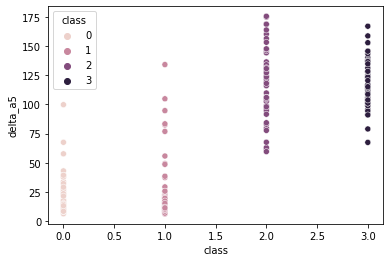

In [804]:
sns.scatterplot(x='class', y='delta_a5', data=df, hue='class')

In [347]:
#sns.histplot(df_squats['delta_d2'])
df_squats[df_squats['delta_a5']>150]

,min_a0,max_a0,min_a1,max_a1,min_a2,max_a2,min_a3,max_a3,min_a4,max_a4,...,delta_d9,delta_d10,delta_d11,delta_d12,delta_a0,delta_a1,delta_a2,delta_a3,delta_a4,delta_a5
24,0.31,93.10,2.81,167.36,152.29,179.98,73.58,179.06,10.26,179.41,...,63.84,48.05,18.03,22.61,92.79,164.55,27.69,105.48,169.15,160.17
27,34.19,68.97,0.12,90.58,62.07,179.69,15.08,175.59,7.97,179.96,...,71.47,63.17,37.12,44.40,34.78,90.46,117.62,160.51,171.99,174.75
29,34.35,128.06,0.01,177.72,41.28,179.97,24.94,178.92,0.43,179.52,...,72.18,29.01,37.23,47.86,93.71,177.71,138.69,153.98,179.09,168.61
46,150.26,179.03,156.83,179.47,42.50,179.40,46.43,172.60,38.25,177.98,...,27.47,17.05,34.86,12.54,28.77,22.64,136.90,126.17,139.73,156.32
118,23.00,103.52,4.77,130.08,0.30,179.98,0.05,163.64,0.02,179.90,...,59.75,15.36,16.63,15.78,80.52,125.31,179.68,163.59,179.88,168.66
132,24.81,162.79,0.62,164.31,0.05,179.86,0.45,169.50,0.17,179.99,...,53.94,23.91,19.55,14.30,137.98,163.69,179.81,169.05,179.82,175.47
170,4.65,179.95,5.01,179.98,72.44,175.65,85.67,179.98,5.77,179.69,...,90.40,74.68,33.36,31.75,175.30,174.97,103.21,94.31,173.92,163.72
185,112.24,179.99,153.86,179.71,66.16,179.92,47.44,168.71,11.92,179.77,...,56.74,26.26,34.76,24.29,67.75,25.85,113.76,121.27,167.85,153.16


v_Lunges_g12_c05.json


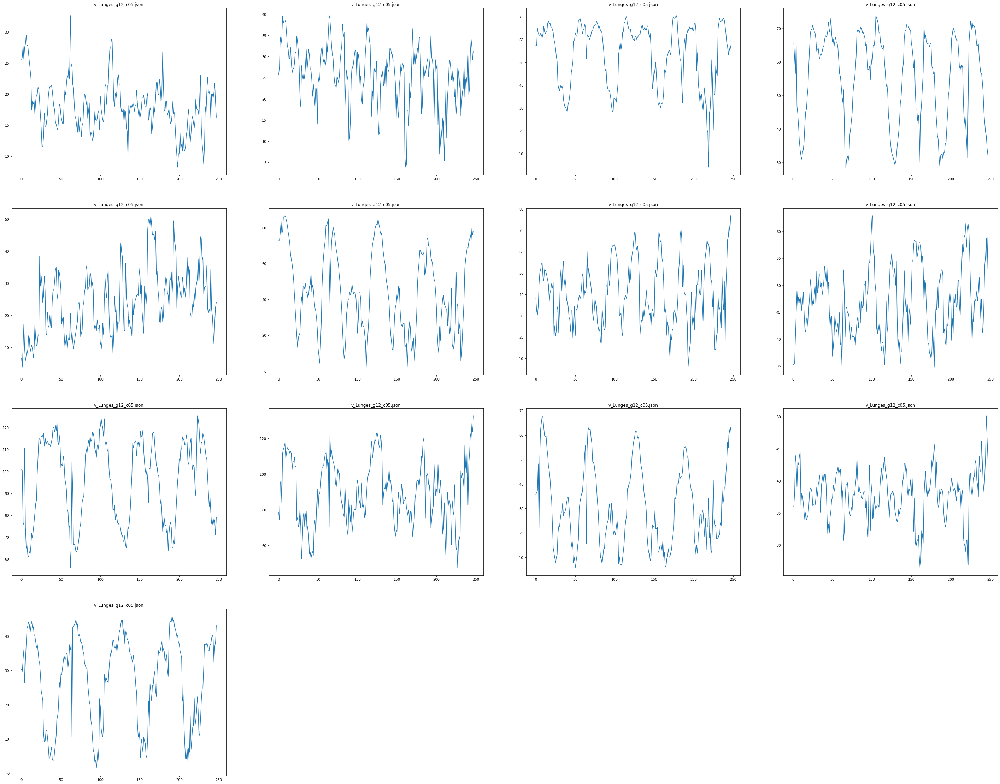

In [681]:
index = 38
a = sigmoids[names[index]]
plt.figure(figsize=(50,40))
for i in range (13):
    plt.subplot(4,4,i+1);
    plt.plot(a[i])
    plt.title(names[index])
print(names[index])

In [685]:
df

,min_d0,max_d0,min_d1,max_d1,min_d2,max_d2,min_d3,max_d3,min_d4,max_d4,...,min_a2,max_a2,min_a3,max_a3,min_a4,max_a4,min_a5,max_a5,mean_body_angle,class
0,0.63,36.11,2.30,13.99,49.94,69.31,43.28,74.30,1.89,34.37,...,82.86,179.34,72.18,178.60,81.25,179.22,78.31,174.07,73.748449,3
1,8.03,35.84,19.36,48.82,68.30,70.54,64.88,67.06,13.01,25.20,...,151.32,166.67,153.94,166.94,159.24,169.19,164.88,171.13,5.256235,0
2,5.04,47.70,2.87,45.70,58.24,68.62,45.72,70.92,2.80,95.71,...,114.04,179.51,122.61,179.98,111.76,179.89,150.58,179.87,80.704001,1
3,21.49,47.07,23.71,48.19,53.99,68.97,52.70,69.14,16.11,82.46,...,162.77,178.26,165.71,176.11,164.69,179.57,165.33,179.77,85.606904,1
4,8.93,47.03,9.47,45.24,61.87,70.50,61.09,69.39,22.85,100.34,...,147.03,177.25,148.50,177.89,171.41,179.94,170.80,179.99,81.286244,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,20.50,46.21,28.27,46.52,54.52,69.65,46.20,69.19,9.08,80.90,...,154.49,175.61,155.15,175.65,166.79,179.98,168.02,179.97,82.412196,1
227,40.66,54.29,31.74,57.24,54.36,64.07,54.61,65.94,27.49,137.58,...,98.89,163.25,111.81,160.95,110.33,179.94,120.42,179.92,74.693109,2
228,25.56,40.23,25.37,41.52,45.24,66.19,42.07,64.47,15.32,28.17,...,73.13,165.54,76.14,162.64,69.74,179.88,72.36,178.23,80.112573,2
229,26.74,48.49,25.87,51.16,54.57,72.83,52.17,72.04,12.80,91.42,...,156.68,179.56,157.04,178.74,166.33,179.93,169.67,179.96,83.570594,1


# sigmoid fitting sur distances

In [750]:
import numpy as np
from scipy.optimize import leastsq
import pylab as plt

def my_fit(t, data, fine_t, freq_data):
    
    guess_mean = np.mean(data)
    guess_std = 3*np.std(data)/(2**0.5)/(2**0.5)
    guess_phase = np.pi / 2
    guess_freq = freq_data
    guess_amp = 1

    data_first_guess = guess_std*np.sin(guess_freq*2*np.pi*t/len(t)+guess_phase) + guess_mean

    optimize_func = lambda x: x[0]*np.sin(x[1]*2*np.pi*t/len(t)+x[2]) + x[3] - data
    est_amp, est_freq, est_phase, est_mean = leastsq(optimize_func, [guess_amp, guess_freq, guess_phase, guess_mean])[0]
    print(freq_data)
    return (est_amp*np.sin(est_freq*2*np.pi*t/len(t)+est_phase)+est_mean), data_first_guess
#''', data_first_guess'''

3.0


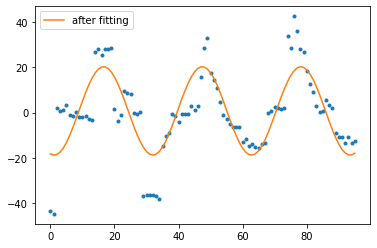

10.751416907967968
3.0


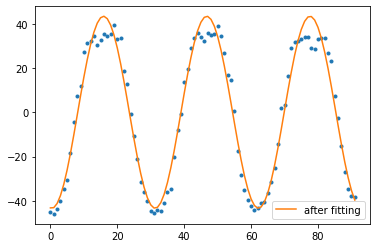

5.7429356851187485
3.0


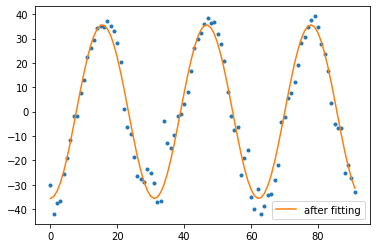

5.677519340761298
3.0


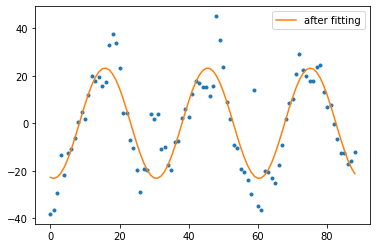

9.726367495082489
2.0


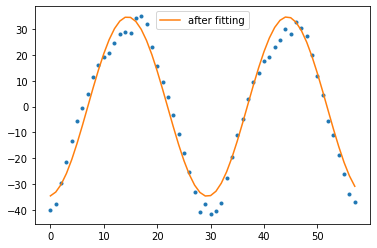

4.523131526158411
3.0000000000000004


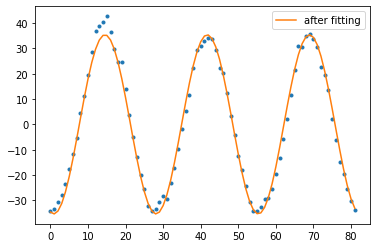

2.764131836690637
3.0


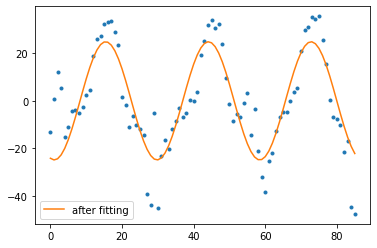

11.318418033688442
3.0


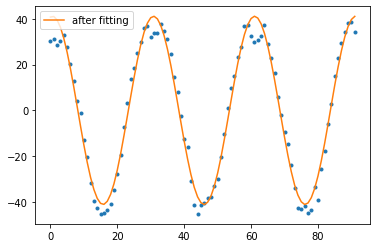

4.506053540780992
3.0


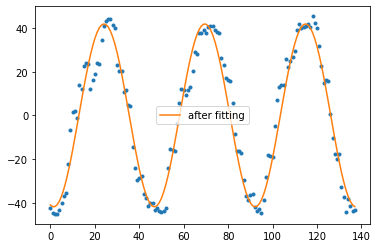

7.000797405484732
3.0


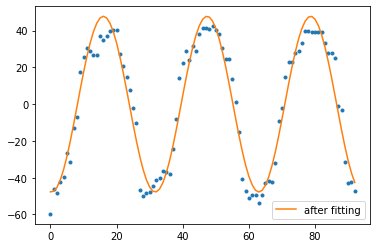

8.421430022323918
3.0


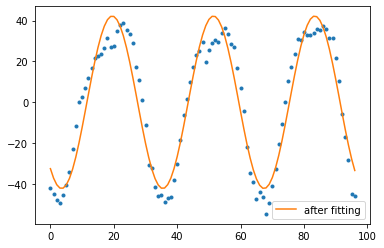

9.084599657520839
3.0


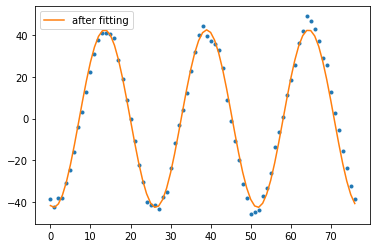

3.466454871641894
3.0


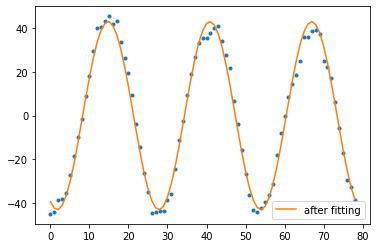

3.5213977998004267
3.0


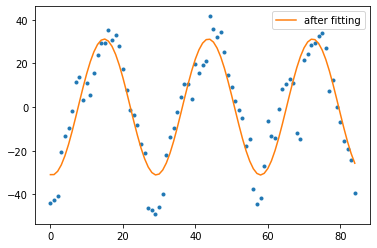

10.251270974828323
3.0


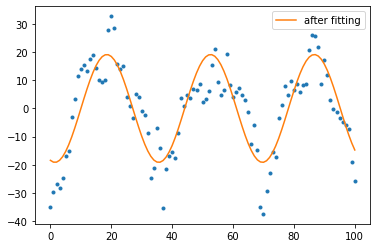

8.134096937345973
3.0


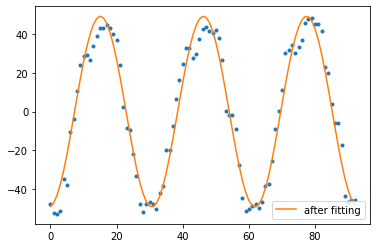

7.283829813535385
2.0


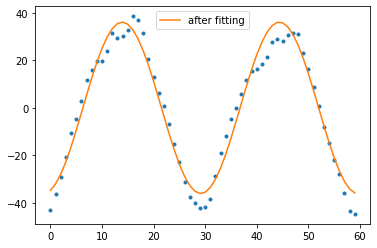

5.102070104717974
3.0


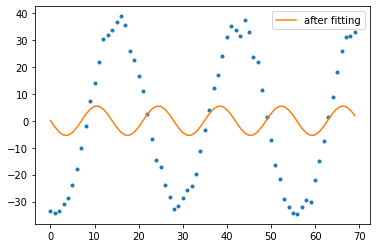

24.762343241551427
3.0


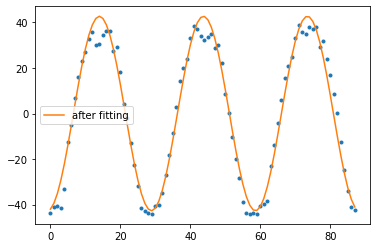

5.018047639106437
3.0


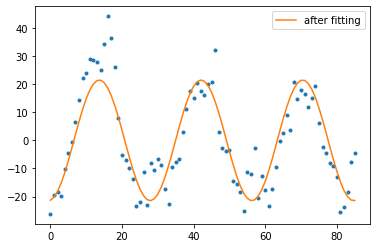

8.404606271621958
3.0


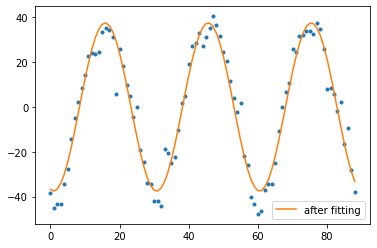

6.264190524669423
3.0


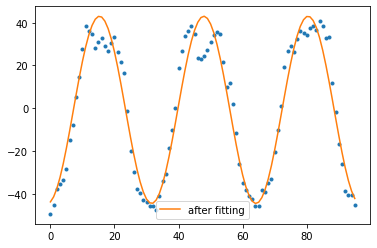

8.226701488215491
2.9999999999999996


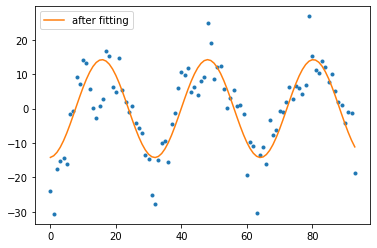

6.248309444437501
3.0000000000000004


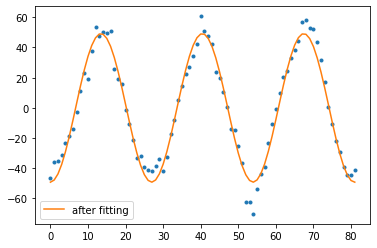

6.609213817061539
2.0


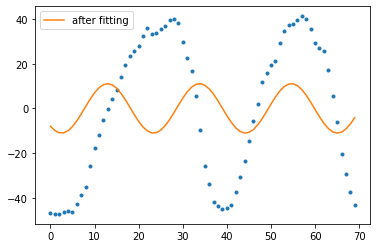

30.32711665877055
3.0


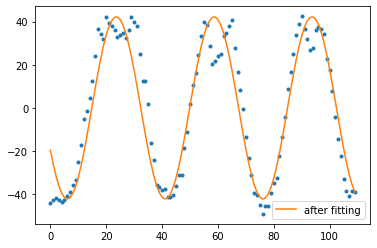

10.400207481404195
3.0


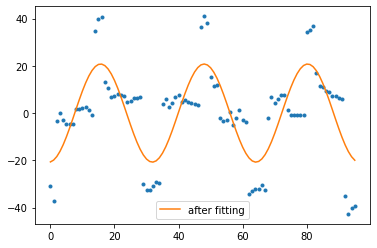

12.73238940916381
3.0


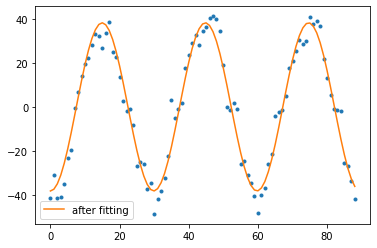

5.930631064168648
3.0


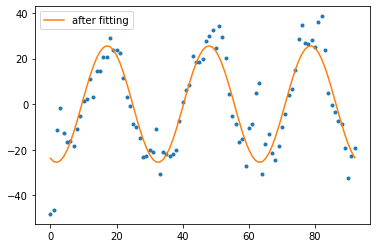

9.257378509956336
3.0


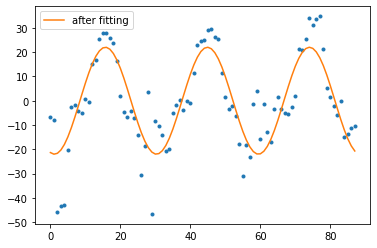

10.386688217106801
3.0


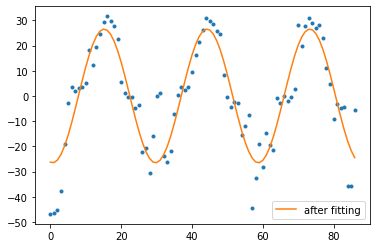

9.06132129616221
3.0000000000000004


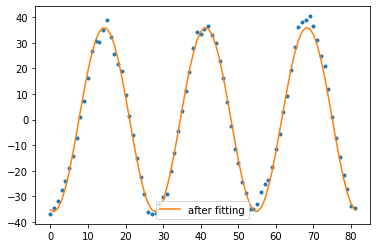

2.3350224543696934
2.0


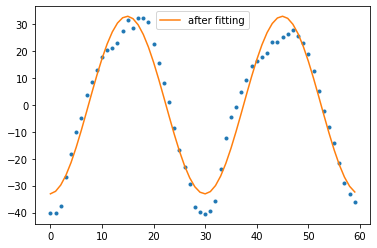

5.3806559595080365
3.0


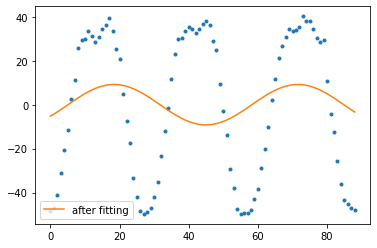

32.18330253334176
3.0


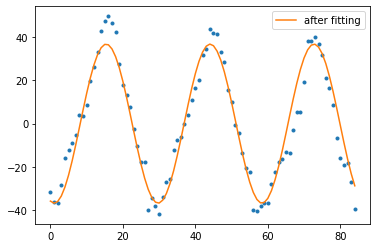

6.940393126635687
3.0


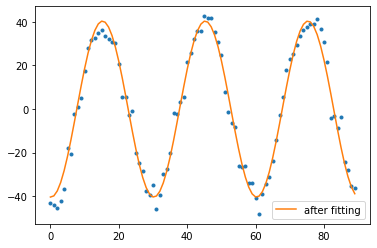

4.7771450850055
3.0


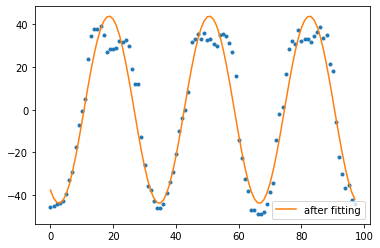

8.690564760424268
3.0


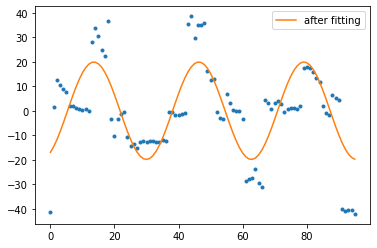

12.062834622137286
2.0


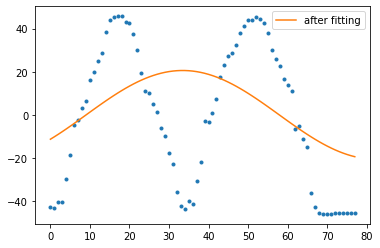

29.191417709072056
3.0


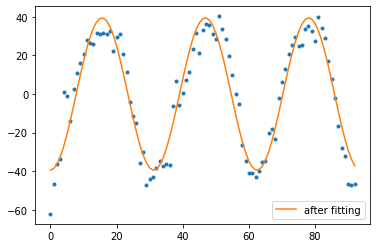

8.86439807489507
3.0000000000000004


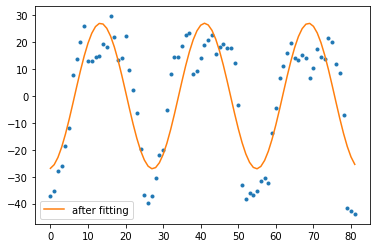

11.41368676749846
3.0


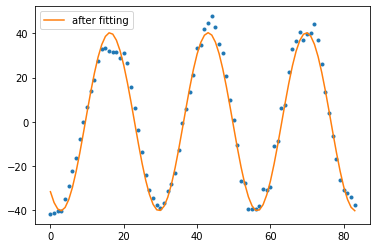

4.303935005776024
2.9999999999999996


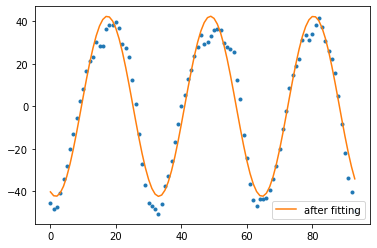

6.655060817564691
3.0


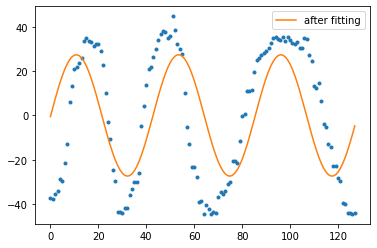

23.023983098089367
2.0


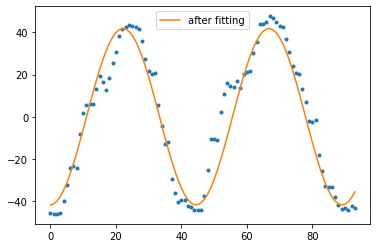

8.292120957578653
2.9999999999999996


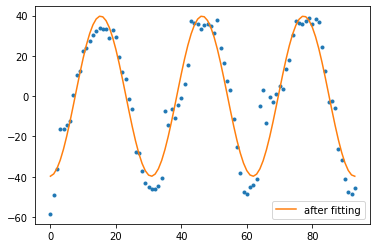

8.984186221036977
2.0


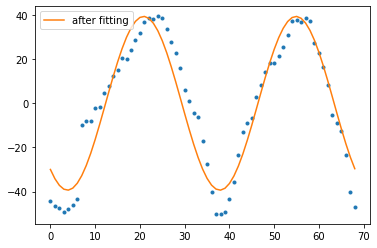

9.258416929646586
3.0


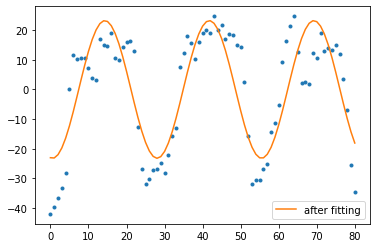

10.716087171604093
3.0


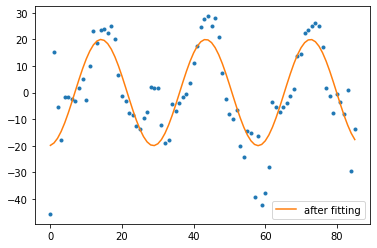

9.756269005588331
3.0


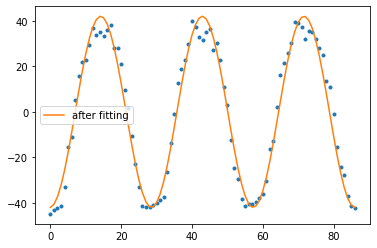

5.212065360746777
3.0


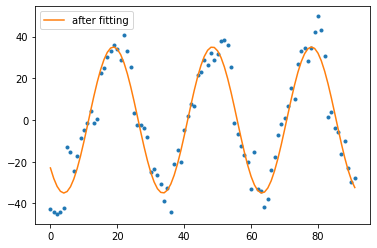

8.223490878718748
2.0


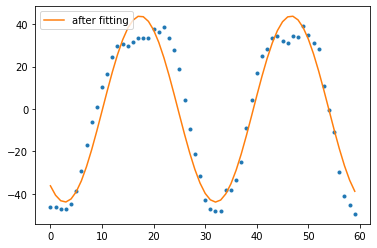

8.83730019533688
3.0


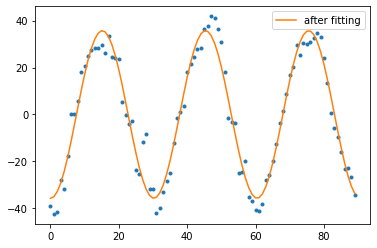

5.840741457002779
3.0


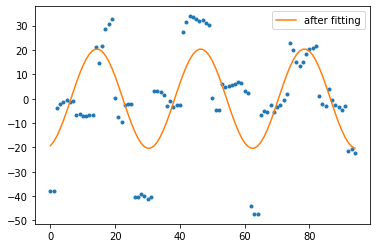

13.806952908291175
3.0


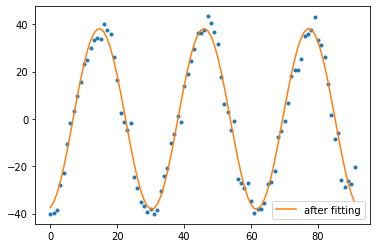

4.640637750503611
3.0


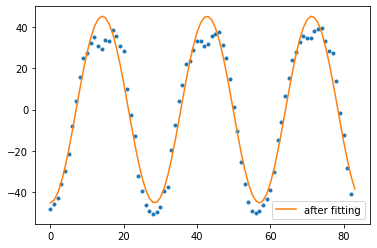

6.648049029371711
3.0


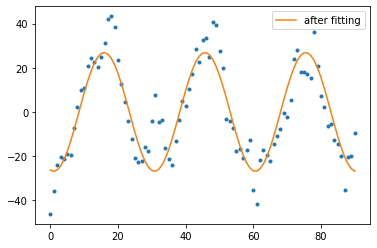

9.71370200863143
3.0


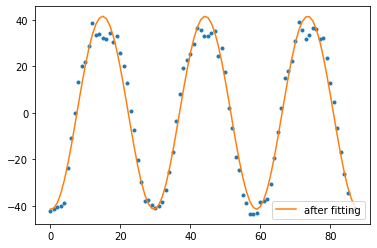

5.007333657289713
3.0


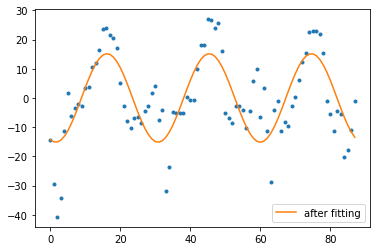

9.667986240421445
3.0


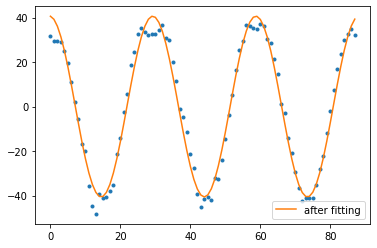

4.606370170012803
3.0


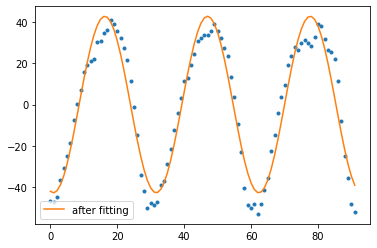

8.006382882491476
3.0000000000000004


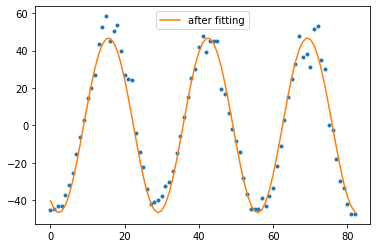

6.111066339047408
3.0


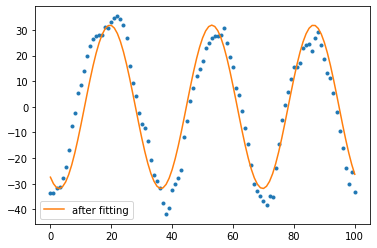

7.563327436052911
2.0


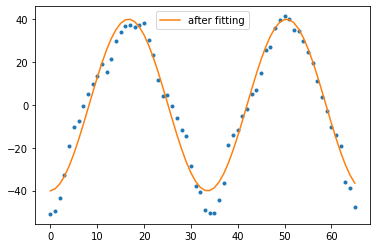

5.947132700430922
3.0


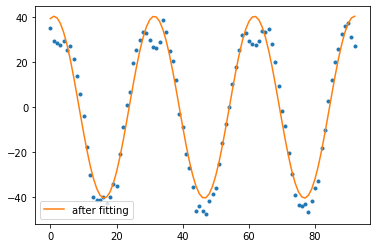

6.264782062295942
3.0


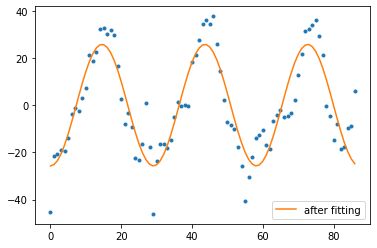

9.496606506846984
3.0000000000000004


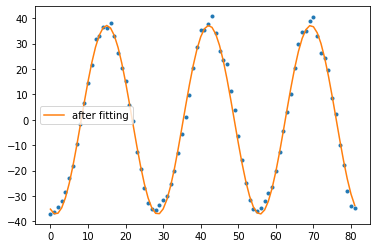

2.2046749233496663
3.0


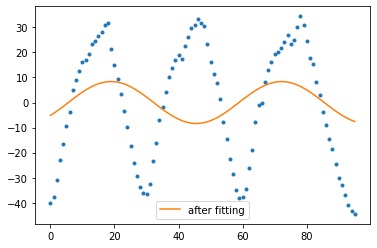

23.003255684538896
3.0


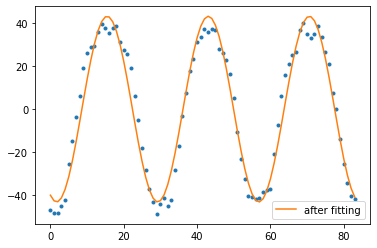

6.400607929807231
3.0


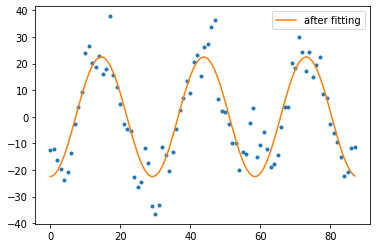

7.934735807092365
2.0


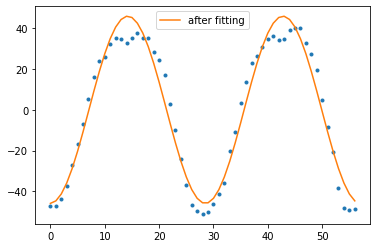

6.617682904502114
3.0


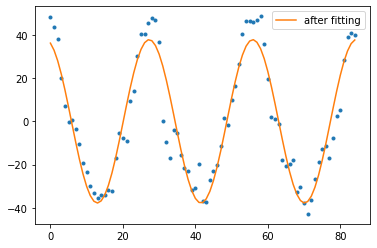

8.892058033107343
2.0


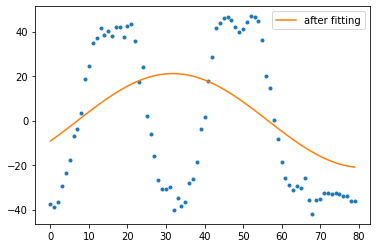

29.16088199446594
2.0


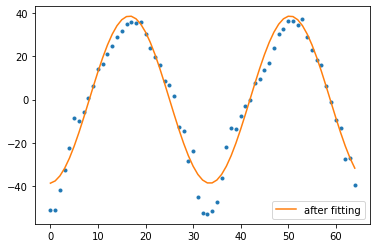

6.030139677046173
2.9999999999999996


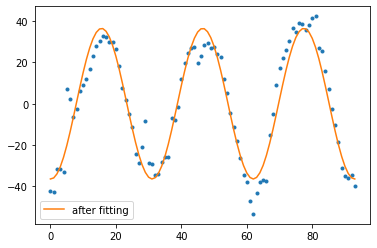

7.5914389451501325
3.0


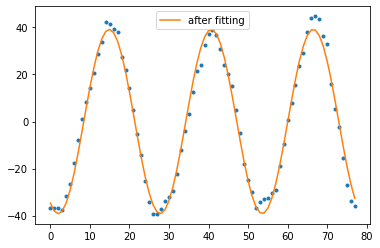

3.31434810898783
3.0


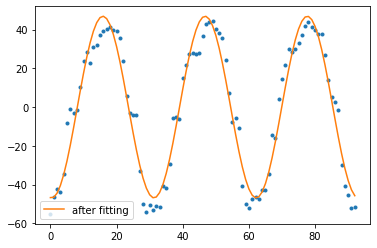

8.064892928379347
3.0


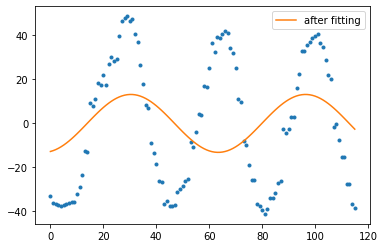

27.72018311296795
2.0


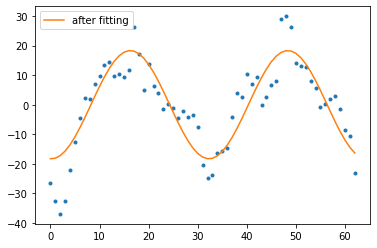

7.258892435002621
2.0


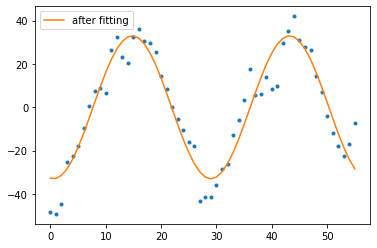

8.188310942917193
3.0


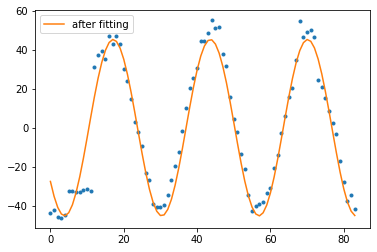

8.036223848928605
3.0000000000000004


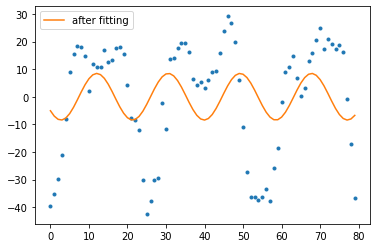

19.62667963471267
2.9999999999999996


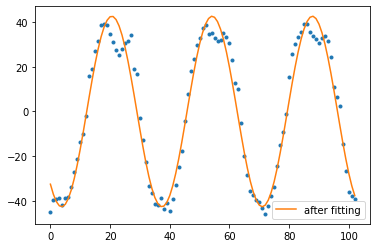

6.413665583503198
3.0


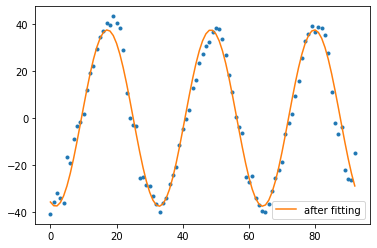

5.108941381881875
3.0


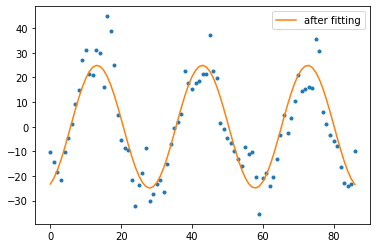

8.220963800982384
3.0


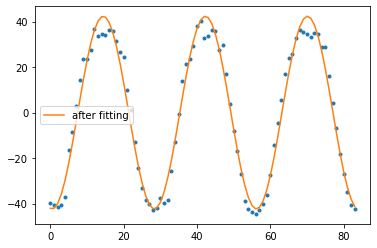

4.883647319581253
3.0


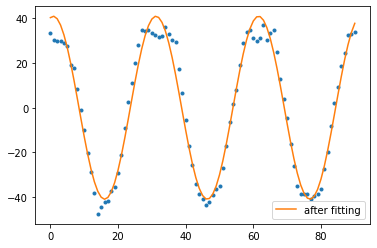

5.176841679386044
3.0


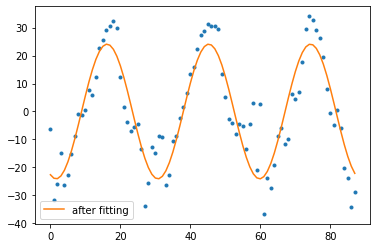

8.44219231497183


In [792]:
#names_jumpingjack = [name for name in names if 'JumpingJack' in name]

sigmoids_jumping = [sigmoid for name, sigmoid in sigmoids.items() if 'JumpingJack' in name]

for sigmoid in sigmoids_jumping[:88] :
    sigmoid = sigmoid[9]
    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    print(np.std(sigmoid-data_fit))
#plt.plot(freq, modul)


1.0
1.0861562312583153


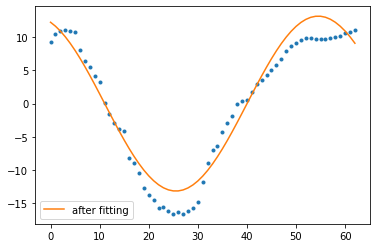

2.050652709110736
1.0
1.0843068347787148


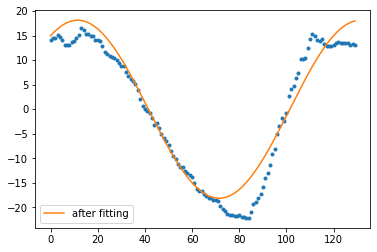

2.929294524312596
8.0
7.6617502960008546


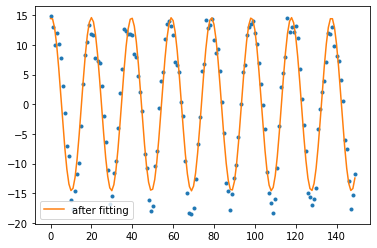

2.6861238226319912
2.0
2.0645947462242087


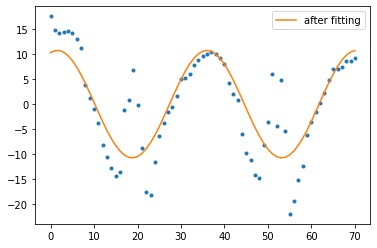

5.958532048564891
2.0
-1.7635881254748316


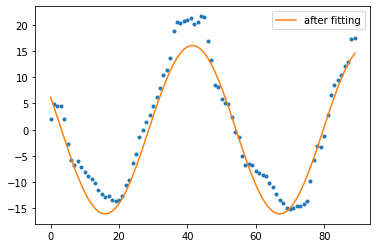

2.55476090822198
1.0
1.1703338300224313


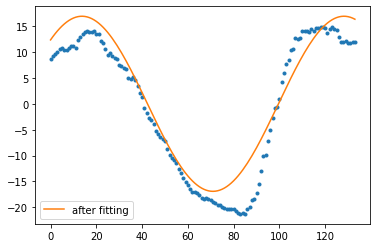

3.1444338305535737
1.0
0.9222572612560173


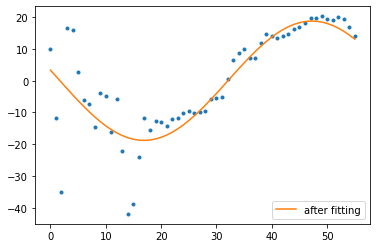

8.353818483344591
3.0
2.98365080348918


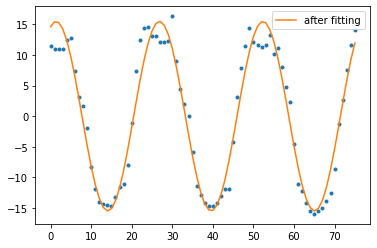

2.5243638826365853
2.0
1.9477704357760601


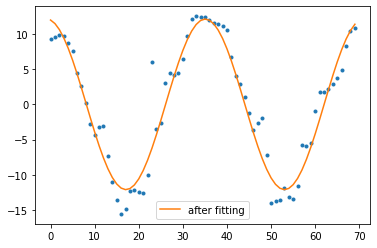

2.41922159836221
2.0
2.0934562125040785


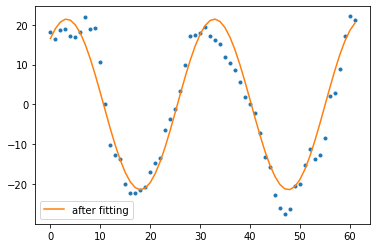

4.061627559612622
3.0
3.9950708891044457


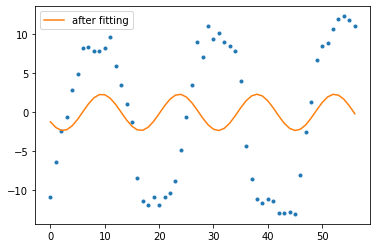

8.731747924536608
3.0
3.0187453224791674


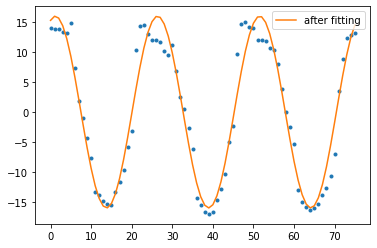

2.7420669375330293
2.0
1.899542260376876


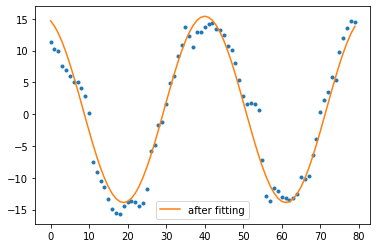

2.1970366815648132
7.0
7.201799161337671


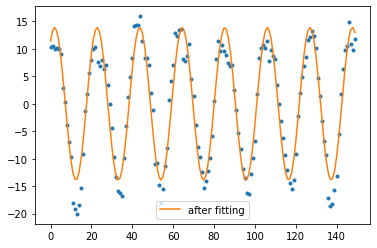

2.875463242403678
1.0
1.0367150205346236


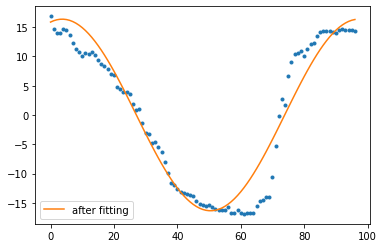

3.0928967887303944
8.0
7.813291529280325


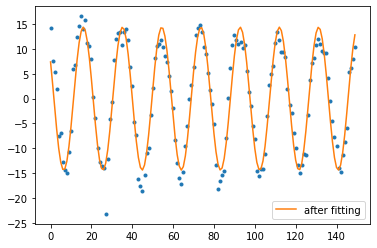

2.879567494791046
1.0
1.0221675033695574


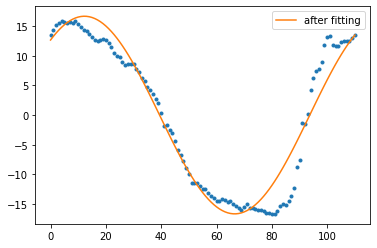

2.8687620405271144
3.0
2.984977520311888


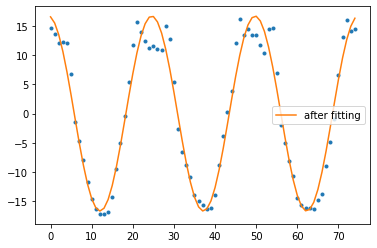

2.695288492093725
1.0
0.9738977188208577


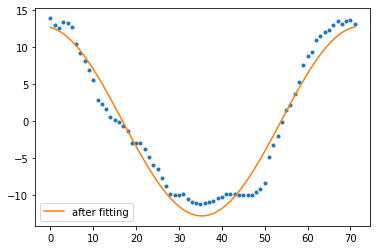

1.7213852405292969
1.0
1.144561598046832


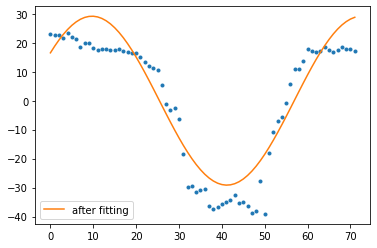

7.13173718907953
2.0
1.8547323356774978


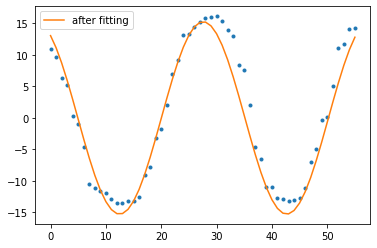

2.2764909258929085
2.0
1.9721930606314317


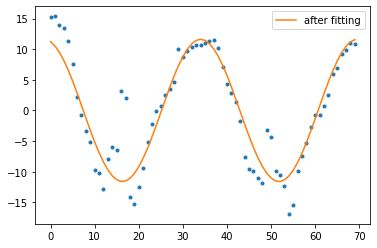

3.753556096295318
2.0
1.842705427428091


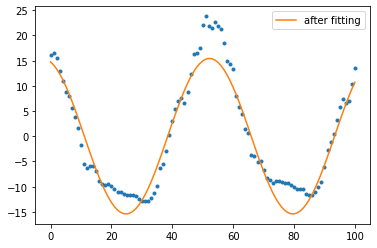

3.013899140912671
2.0
2.107288119123683


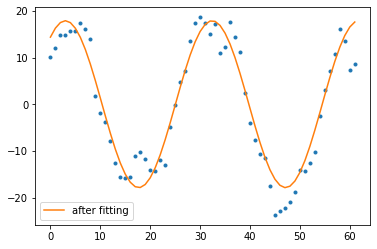

3.6536391156338537
2.0
2.0117313616117167


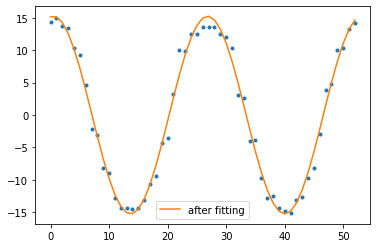

1.2959493624512435
2.0
1.9873620407088377


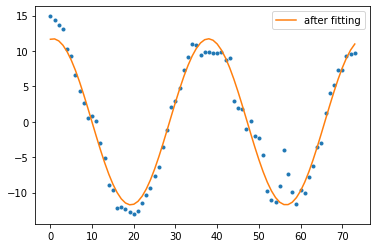

1.7397133899216441
1.0
0.9894331425846586


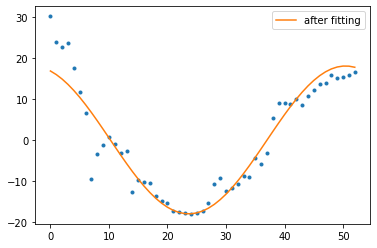

4.362786407567746
2.0
2.1076282959624506


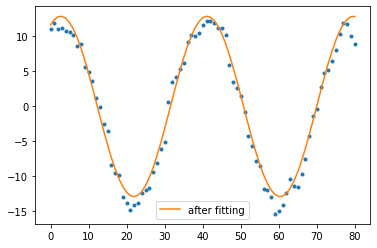

1.1501211349787634
1.0
0.9958291786983038


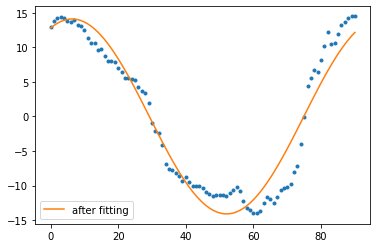

2.5511012052334983
7.0
7.047080973065958


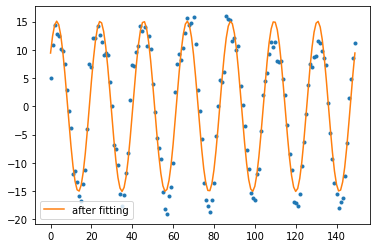

2.752269789792535
2.0
2.0386805234980665


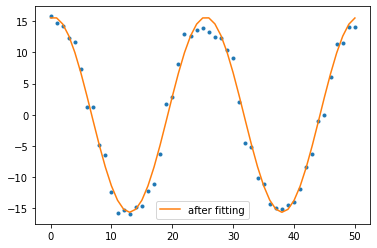

1.394144407138457
4.0
4.400077115635885


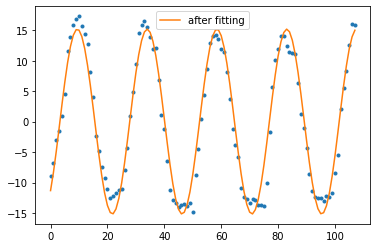

2.1945595998719543
2.0
2.0752520170779514


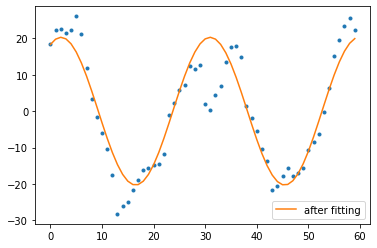

6.010710359955333
1.0
0.920515198038771


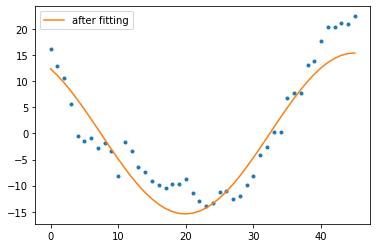

3.6856809123691923
2.0
2.0119146827282166


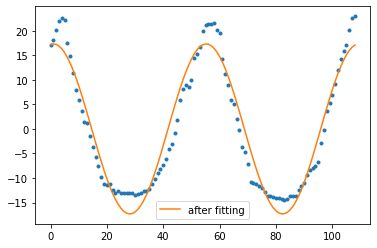

3.179405635547045
2.0
2.0374828858241605


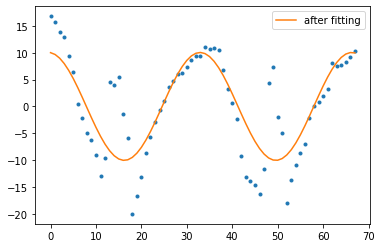

5.839248573231942
2.0
2.0754013051986036


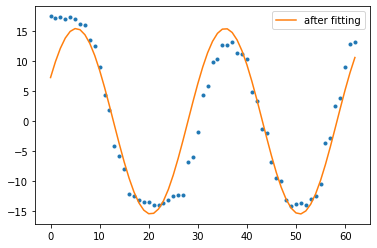

3.4947515629944874
2.0
2.107560669213062


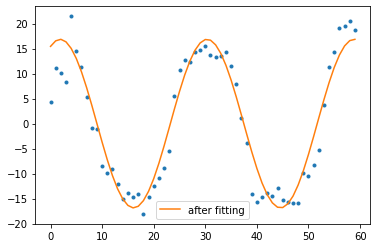

3.679781615436568
2.0
1.9369538947024731


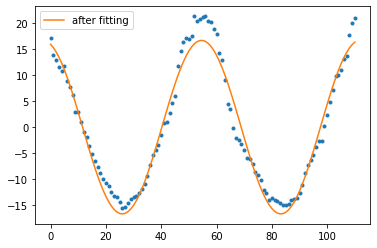

2.238226645326458
2.0
1.9875074295888415


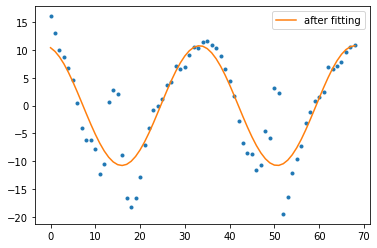

4.55376905537448
2.0
1.6498926558876865


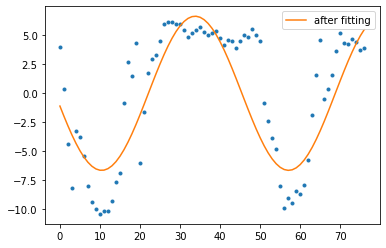

3.184816175977239
1.0
0.9391678960507763


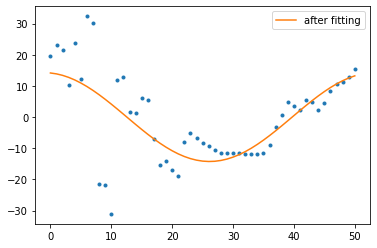

9.96539959823718
2.0
2.0214926143664673


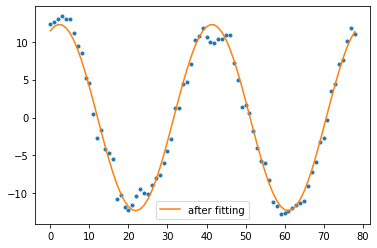

1.1291917958055406


In [657]:
#names_jumpingjack = [name for name in names if 'JumpingJack' in name]

sigmoids_pushups = [sigmoid for name, sigmoid in sigmoids.items() if 'PushUps' in name]

for sigmoid in sigmoids_pushups :
    sigmoid = sigmoid[0]
    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    print(np.std(sigmoid-data_fit))
#plt.plot(freq, modul)

1.0
1.1678710299299777


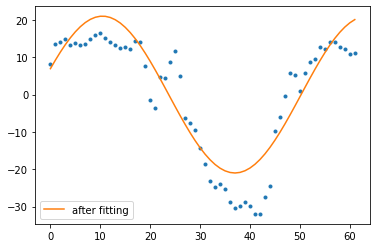

6.3355095318367045
2.0
1.921319754565714


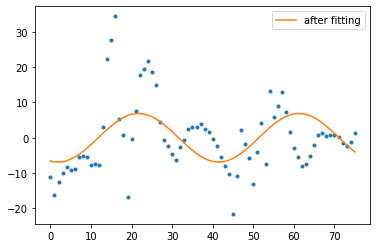

8.771851596085742
3.0
0.7700041177390481


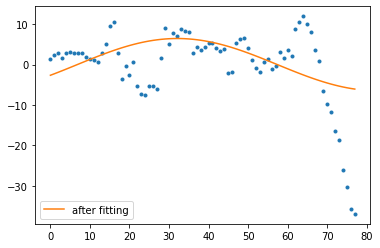

8.312383672946998
3.0
3.2765035716636883


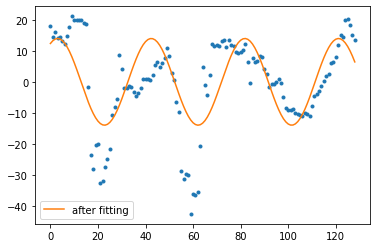

10.514868367161709
1.0
0.9345419664075063


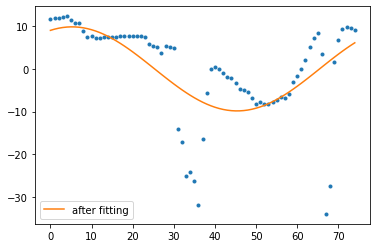

8.519981982413846
4.0
4.0062873772733445


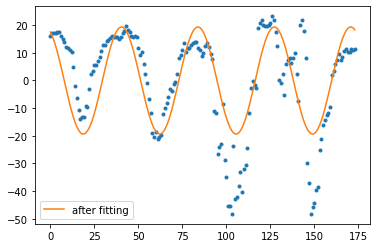

12.111497576533086
1.0
1.044603142776993


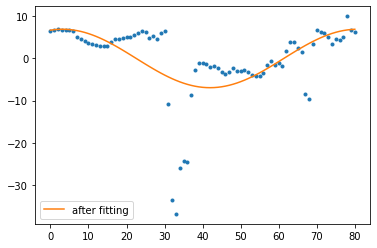

7.193605622124946
4.0
3.7581216223599454


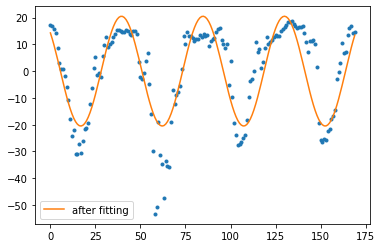

9.259663732510896
4.0
3.692561574934685


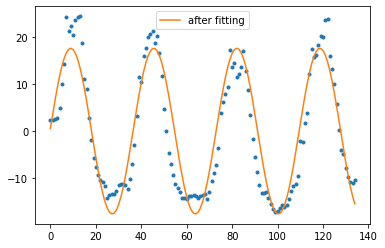

4.6614888860694945
6.0
6.998556326781268


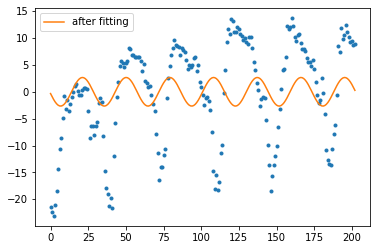

9.011319183713415
6.999999999999999
7.100213238301428


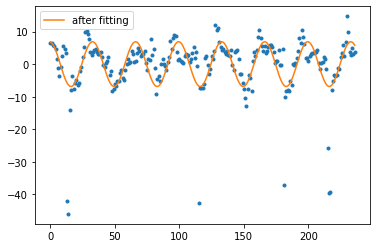

6.787834481391542
4.0
4.289576384902329


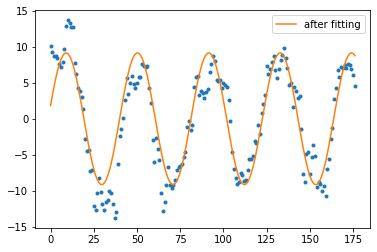

2.9052824328078417
2.0
2.0932387235650847


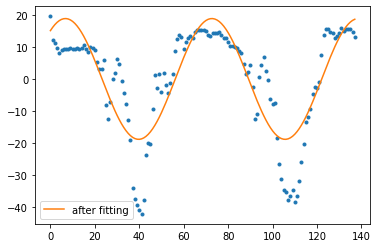

9.006325494811103
2.0
0.9509107267581485


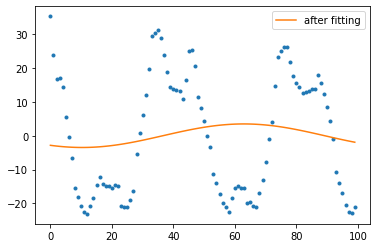

17.405082685042593
2.0
1.928333176146585


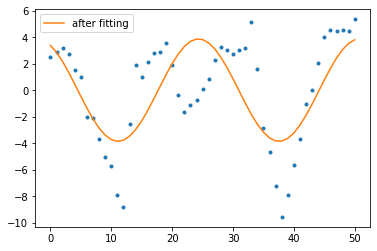

2.913748789572116
3.0
3.115148807746107


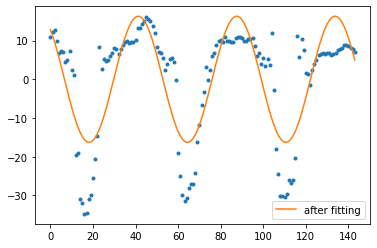

8.832195466175868
1.0
1.0606843129922983


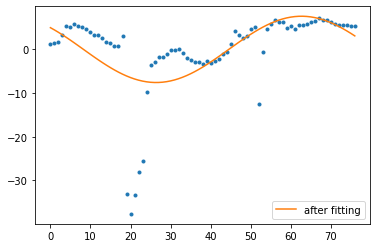

7.5520782430632405
1.0
1.1362938538731922


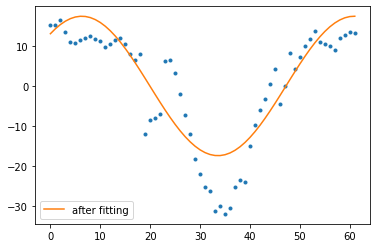

6.482870425806177
2.0
2.126801502648698


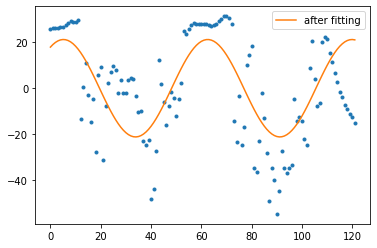

16.504026971894852
2.0
1.8576275485705886


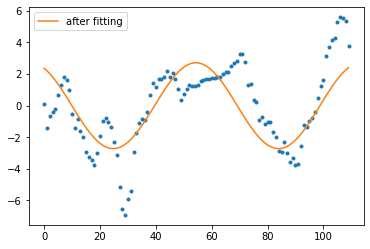

1.7588758320338094
7.0
7.052008044841849


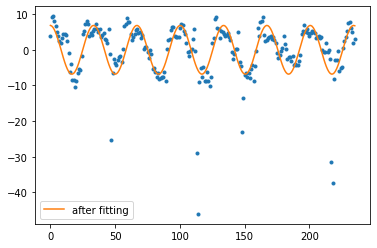

5.4436578371874145
3.0
3.0440250715865282


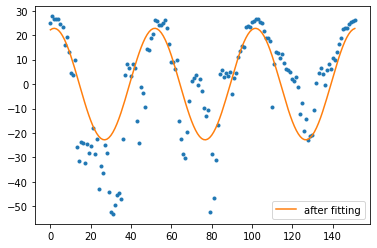

13.968630252692375
1.0
2.212093540420996


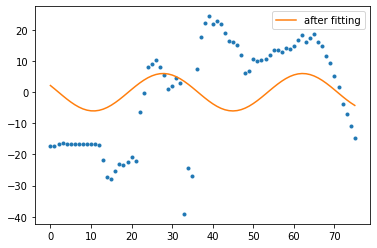

15.996267355233334
10.0
9.958458945325457


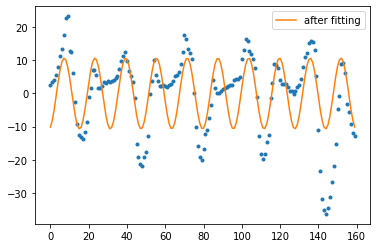

9.21120514688505
6.0
5.826803847605648


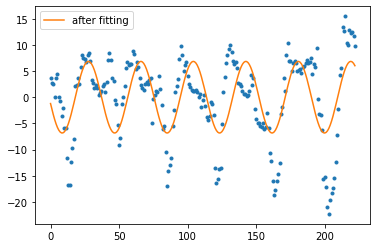

6.121909543430222
1.0
1.077751314283599


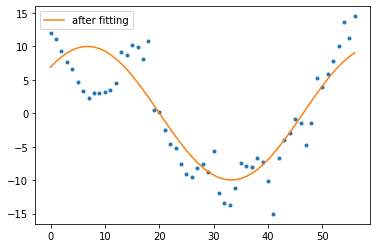

3.742942538255026
1.0
1.2986516341252436


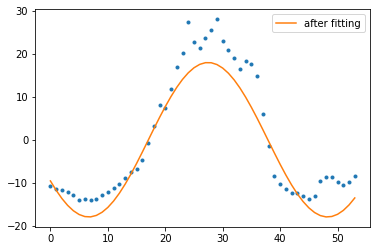

3.857035798296162
2.0
2.1706968037415213


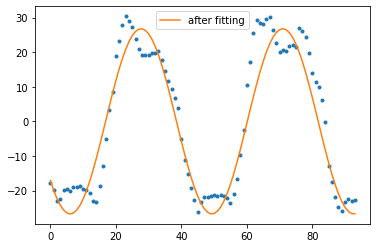

6.341701542562655
10.999999999999998
10.67330718339807


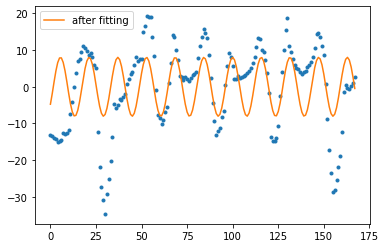

9.999235805947238
3.0
4.477622224799093


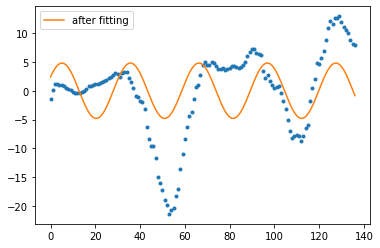

6.541450991584119
3.0
3.298418757819507


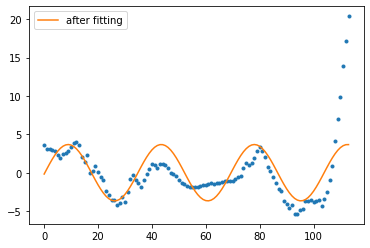

2.8829821632102766
3.0
2.824366660336354


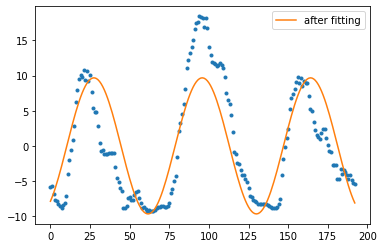

4.394803338608133
0.9999999999999999
1.2488342913452022


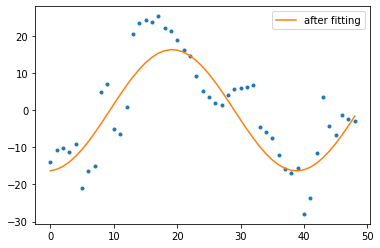

6.977180403584028
3.0000000000000004
2.9246691660125412


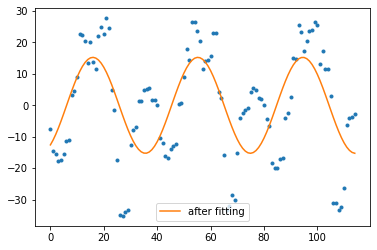

13.887374041648858
1.0
0.6454799414022144


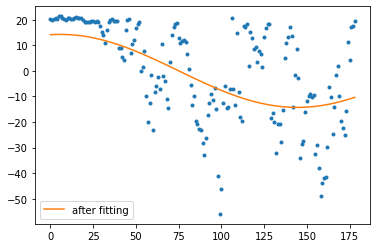

15.287640264164184
2.0
1.5922935865132508


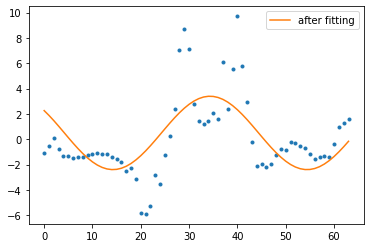

2.4041309890610885
4.0
3.9928270585534364


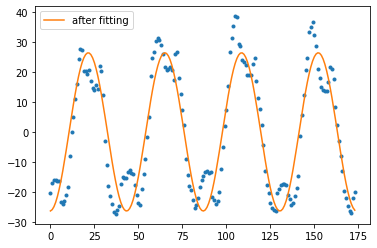

8.09113843294001
3.0
2.838506782878796


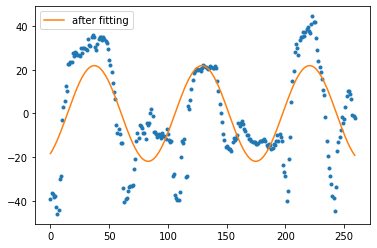

17.291253923516592
2.0
0.8669134088468865


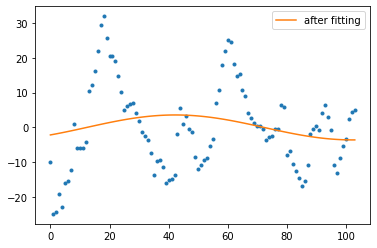

11.868096283936374
5.999999999999999
5.890726214857972


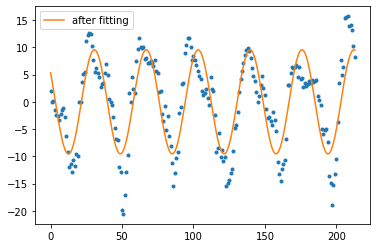

4.337346314022642
3.0
2.9550570800027534


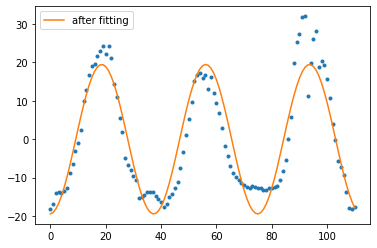

5.240382558886254
2.0
1.9359598096707085


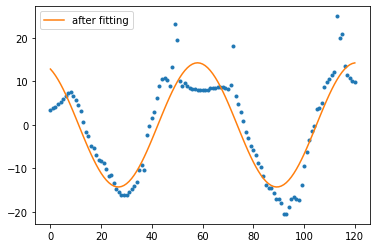

4.791982747236057
4.0
3.8093160270830655


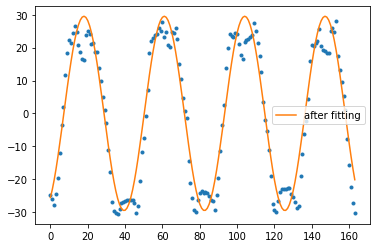

6.047192668510267
2.0
2.0015334740405137


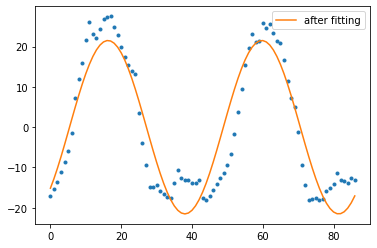

6.178695082018307
6.000000000000001
5.902387191371074


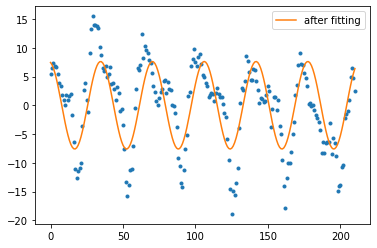

4.766782485526207
1.0
0.8978349276043791


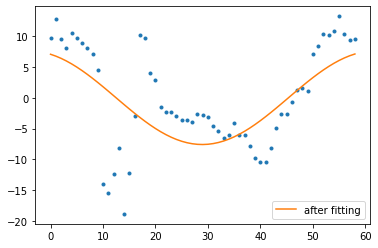

6.317089295640198
4.0
4.408191147448762


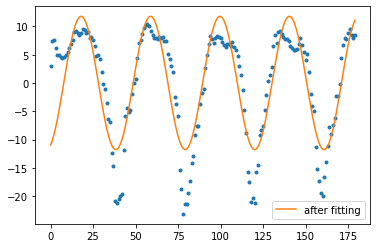

4.869406459320113
1.0
0.9030736845528876


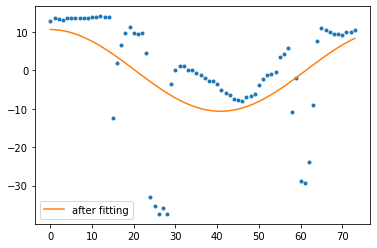

11.613621511132722
3.0
1.4961151500474719


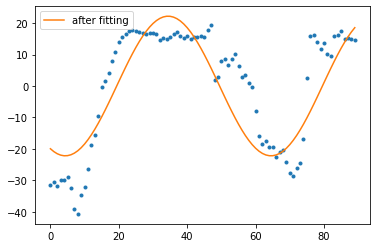

9.786460438812774
2.0
1.691910194547801


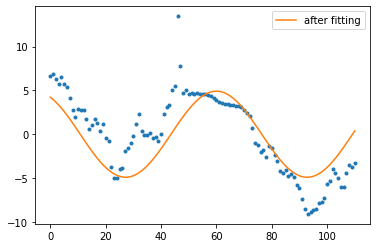

2.876574064469493
2.0
1.9896437024183256


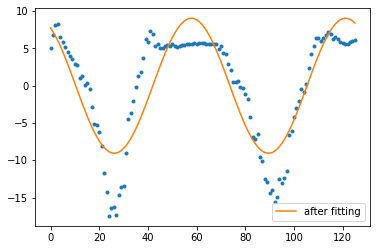

3.6096913460331166


In [673]:
#names_jumpingjack = [name for name in names if 'JumpingJack' in name]

sigmoids_squats = [sigmoid for name, sigmoid in sigmoids.items() if 'BodyWeightSquats' in name]

for sigmoid in sigmoids_squats :
    sigmoid = sigmoid[9]
    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    print(np.std(sigmoid-data_fit))
#plt.plot(freq, modul)

51
1.0
1.185926755844704


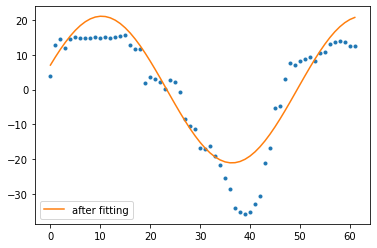

5.956378340297153
2.0
2.3837625159628106


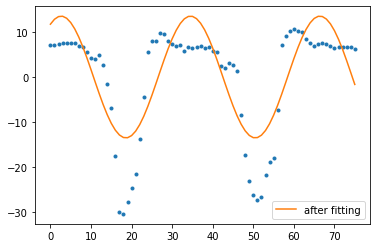

7.240250727386903
2.0
2.2242163944159477


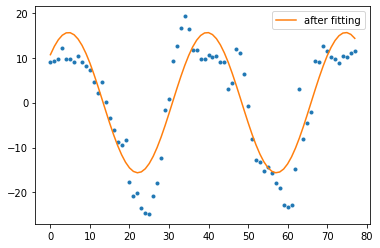

5.2788456727320305
2.0
1.8060420736596992


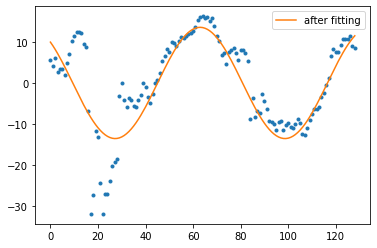

6.121111879872148
1.0
1.5584749331803


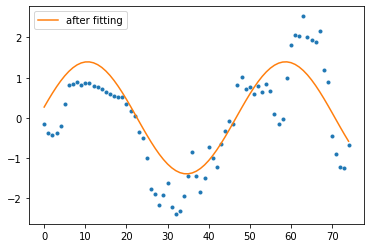

0.6616385386194622
4.0
3.9302042399832384


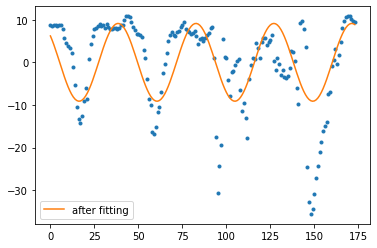

8.138883730475566
1.0
1.500306501326094


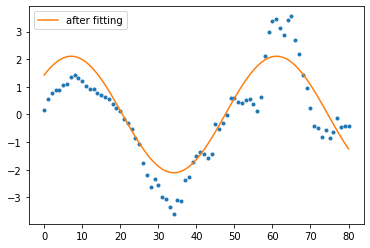

0.7230068366164689
4.0
3.7733148211594996


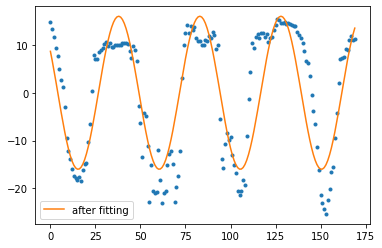

6.790685294390734
4.0
3.745482048979199


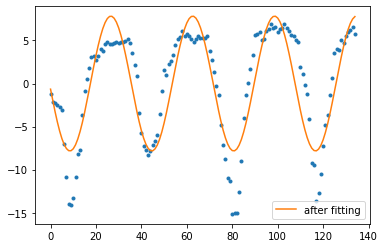

3.03009402294125
6.0
6.929257492975414


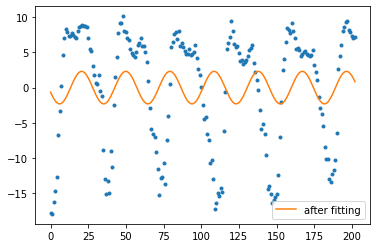

8.053430590539305
6.999999999999999
7.111357090566537


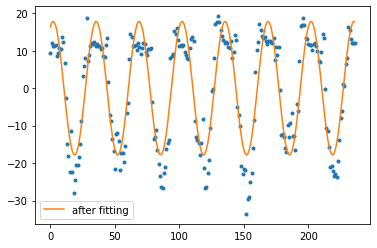

6.546920623462287
4.0
4.3024240343536215


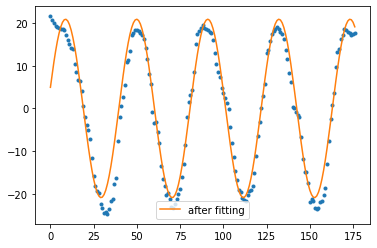

3.478616131160201
2.0
2.139947157388834


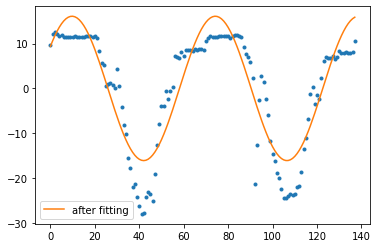

5.427482632614058
2.0
2.3567518546758452


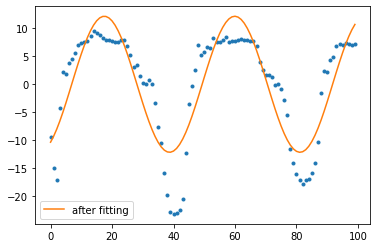

4.765787732452199
1.0
1.234118775839463


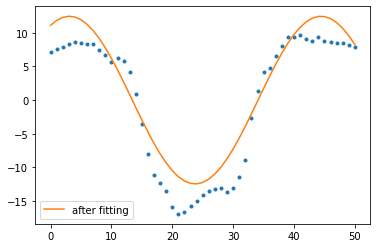

2.4460068455964863
3.0
3.083824150057918


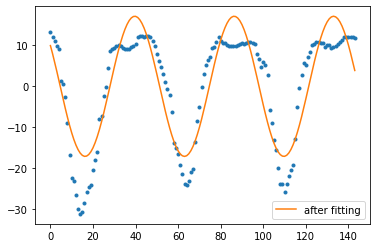

6.192502635366473
2.0
1.6859522936720417


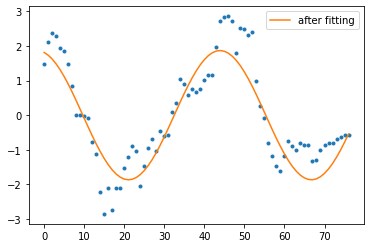

0.6420517372358261
1.0
1.1742951846675216


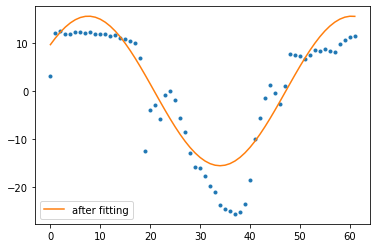

4.681357209982555
2.0
2.0816909226777423


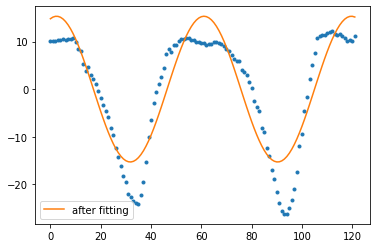

5.097982743474082
2.0
1.8718505986708909


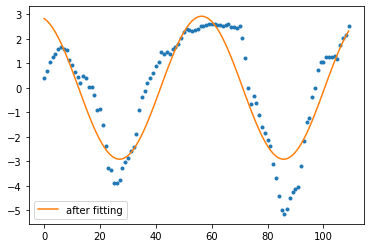

0.9937877977977266
7.0
6.97079563910683


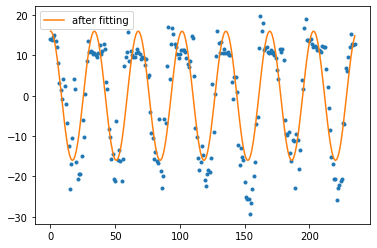

6.87980562322271
3.0
3.174778479303421


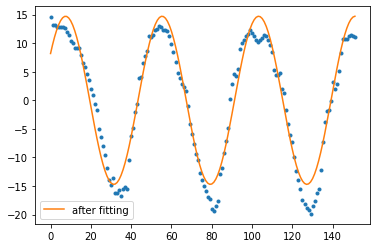

2.504322529941384
1.0
1.1708039924743268


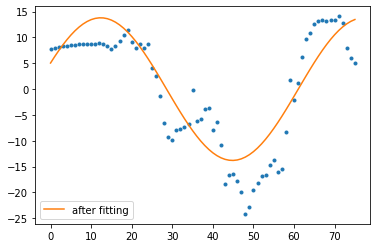

4.98999078969698
5.0
4.991474048025775


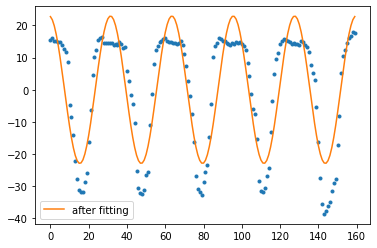

8.430947733265647
6.0
5.90345627679836


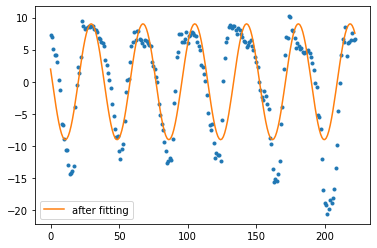

4.8837664117208455
1.0
1.0197736336597742


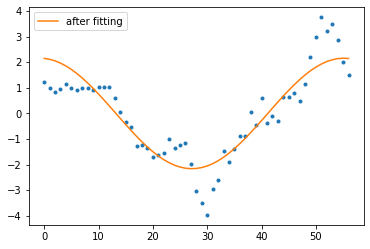

0.7404936291249482
1.0
1.4399000068475196


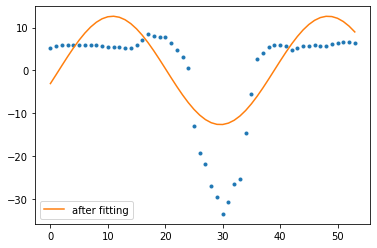

7.500159822991683
2.0
2.2335852255738278


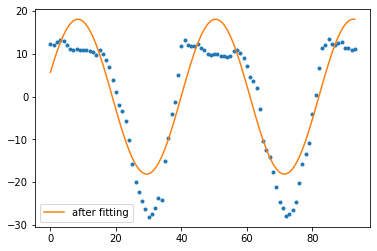

5.578249543163506
5.0
5.297877346848593


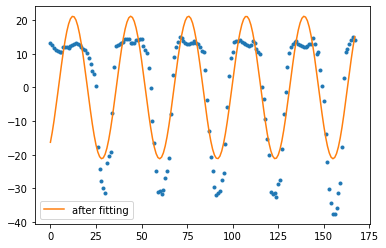

8.846997895290274
2.0
2.2121719639750594


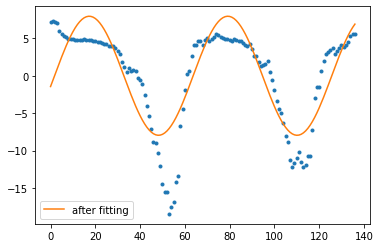

3.5489692666341206
2.0
1.7779833462436614


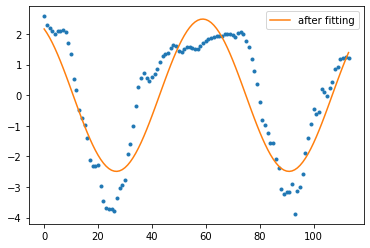

0.8663625250227095
3.0
2.9365537559884953


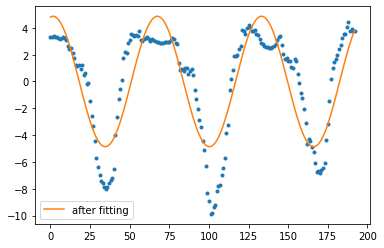

2.057050038697964
0.9999999999999999
0.89859829227723


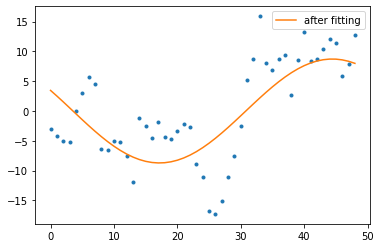

5.643304400343028
3.0000000000000004
2.9434289361933845


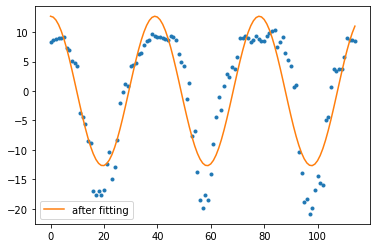

4.190240181093712
3.0
2.9540968087504127


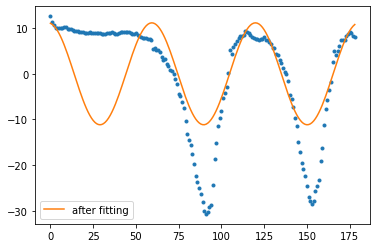

9.38322213060665
1.0
1.510472702297138


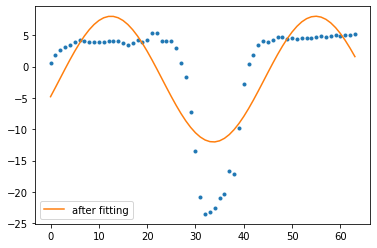

5.171954570772473
4.0
4.006887613389306


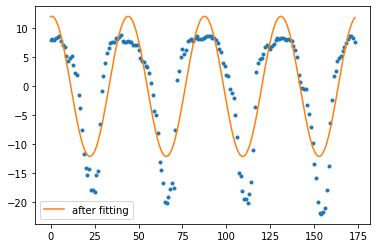

4.660153507135125
8.0
7.75479858483895


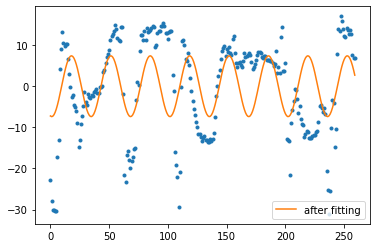

10.306404812117568
2.0
2.1094636484604172


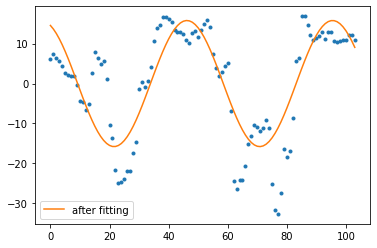

8.097990296856128
5.999999999999999
5.9013103707453824


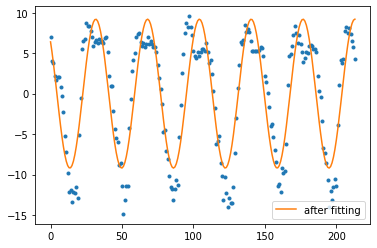

3.4069575732965243
3.0
2.955306152380304


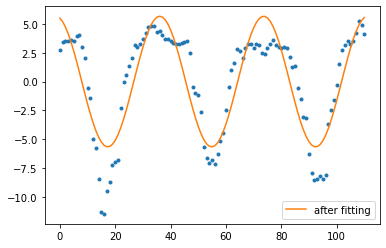

2.1407625761739775
2.0
1.9520430136287872


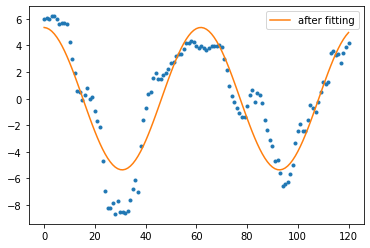

1.7184560101596493
4.0
3.8335141033281084


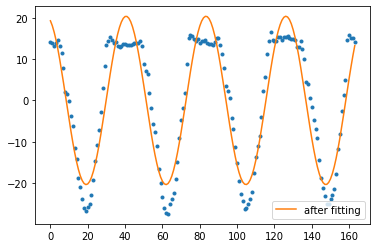

5.150642663429887
2.0
2.0092670353521624


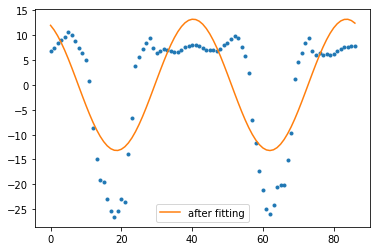

7.597811172672247
6.000000000000001
5.853972175300478


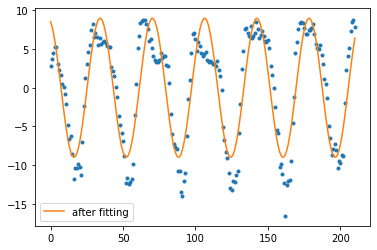

3.2075197519248717
1.0
1.060622175932346


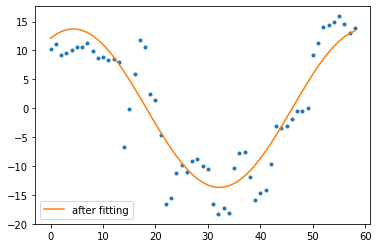

4.4025456848878095
4.0
4.4445074103598445


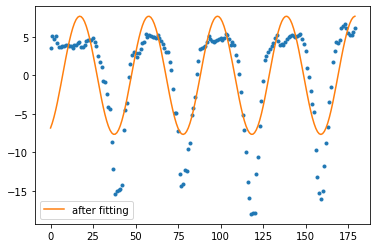

3.9570904473471034
1.0
1.1948321807744238


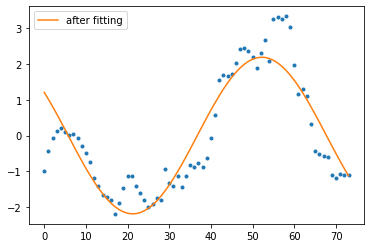

0.6646467154684816
1.0
-1.0976313261846962


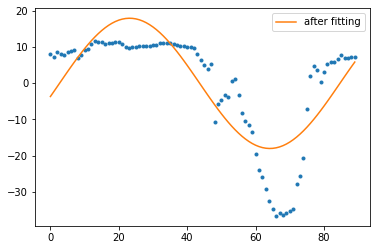

8.630234486704493
2.0
1.70024372128859


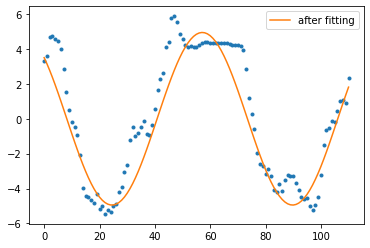

1.2219974267729825
2.0
1.9747572257771815


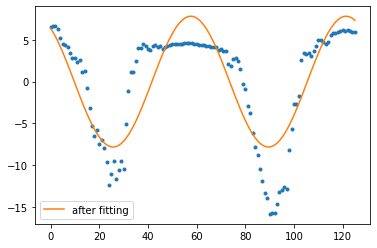

3.4820718810247255


In [677]:
sigmoids_squats = [sigmoid for name, sigmoid in sigmoids.items() if 'BodyWeightSquats' in name]
print(len(sigmoids_squats))
for sigmoid in sigmoids_squats :
    sigmoid = sigmoid[3]
    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    print(np.std(sigmoid-data_fit))
#plt.plot(freq, modul)

51
1.0
1.076628947930579


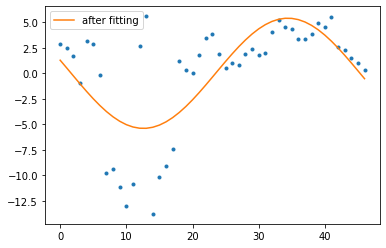

3.923942028281251
3.0
3.342863257171799


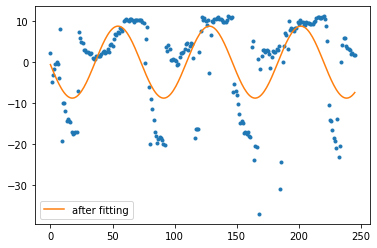

8.452240503977208
2.0
2.046781470191242


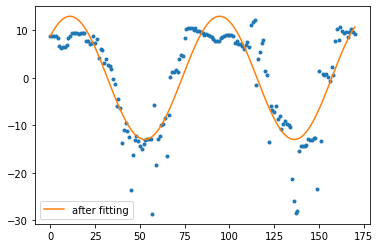

4.8437208626403
1.0
0.7187365941069918


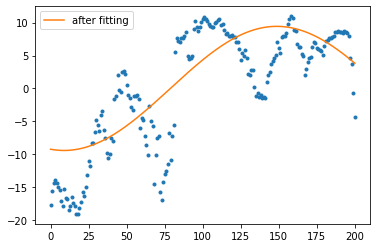

5.390509043121703
3.0
4.8135926516399


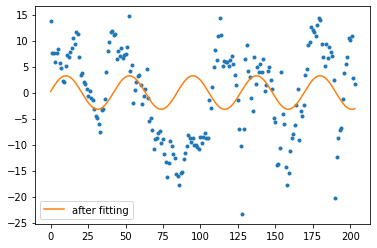

8.145796385478993
8.0
7.686396436039149


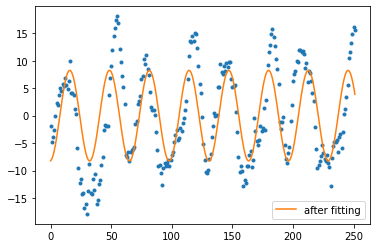

6.176110211387624
1.0
1.134275145936183


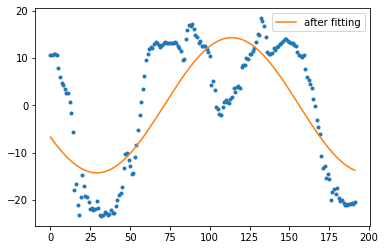

9.275832434086574
9.0
9.20045713941249


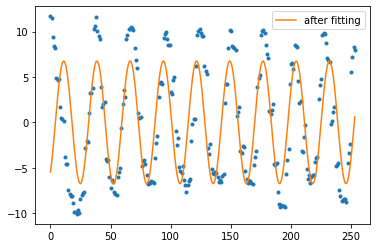

4.412599455860863
4.0
4.169782122392083


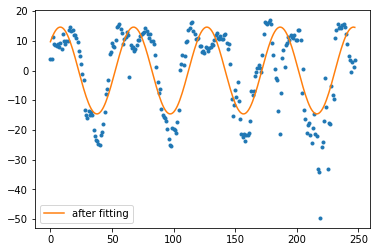

8.809177979565458
2.0
2.1190964479057226


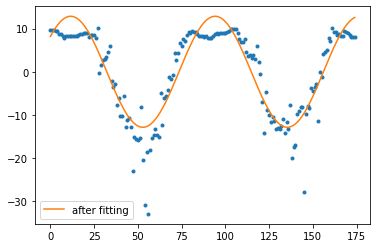

4.242807203274877
1.0
0.9638698461041306


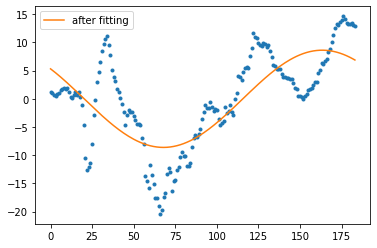

5.588322496694591
7.0
7.148426980279047


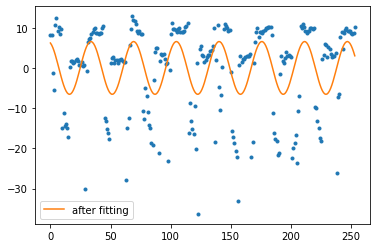

9.73983992224723
5.0
4.964810394993625


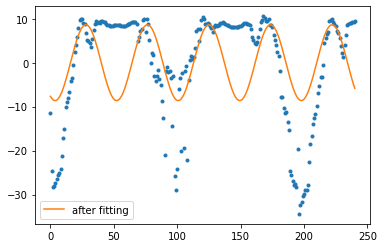

10.618421638138384
1.0
1.0567670876666688


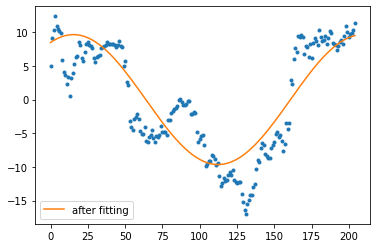

3.9180135423055322
1.9999999999999998
1.9794932367650637


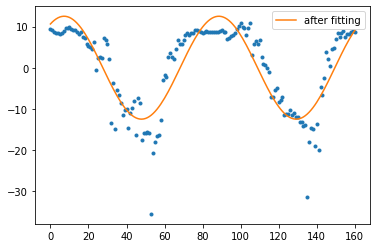

4.908807795159496
8.999999999999998
8.579082907165626


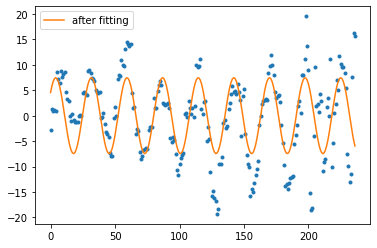

5.730269700716044
2.0
2.030033099511723


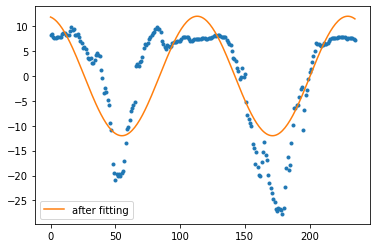

6.293030872695427
3.0
3.4312275657116267


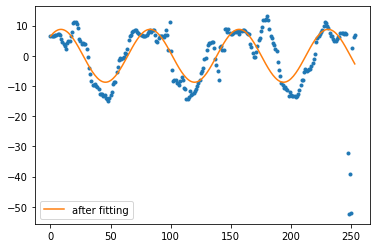

7.43922710571516
2.9999999999999996
3.4118003930849388


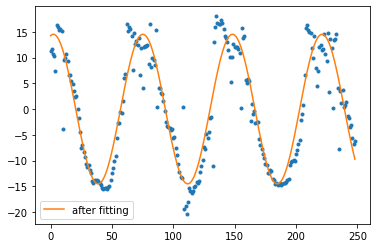

4.086718235403222
4.0
1.7525203310336068


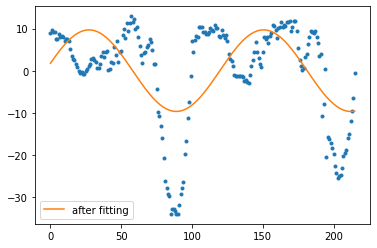

9.706662859722984
3.0
2.83968136634762


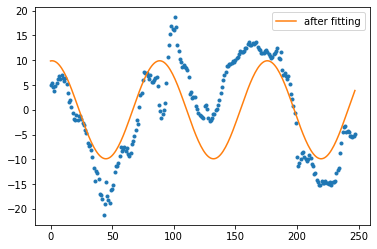

6.614765752859534
3.0000000000000004
2.674069308898909


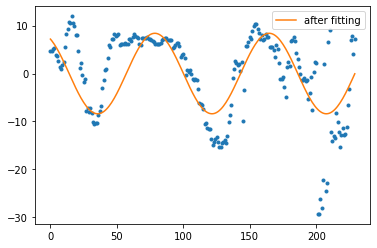

6.36584237794484
2.0
1.7940423622014363


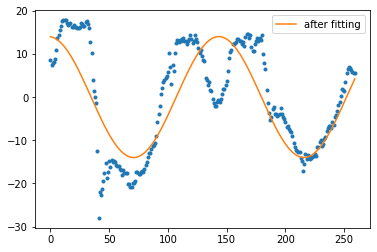

7.278564096155824
3.9999999999999996
3.6371638008632483


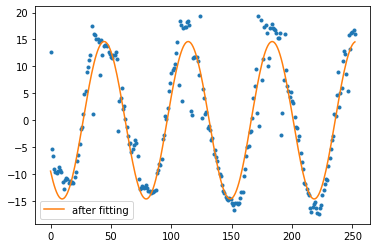

3.732680827845564
3.0000000000000004
3.3011995474425277


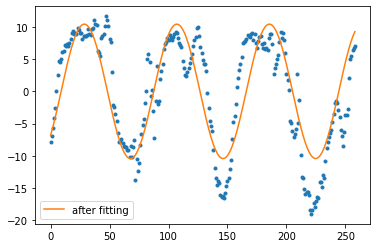

4.678400821617031
1.0
1.06081913771579


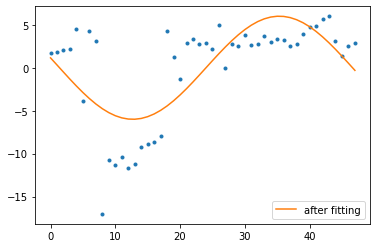

4.101503880083913
7.999999999999999
7.931432182455415


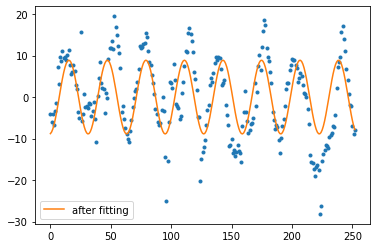

6.922517359205928
1.0
1.0978919840539185


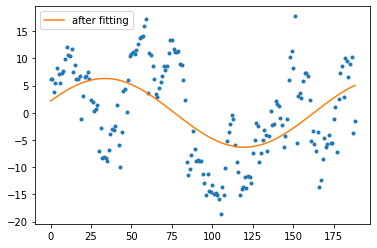

7.3795314847425395
2.0
1.1339065269104265


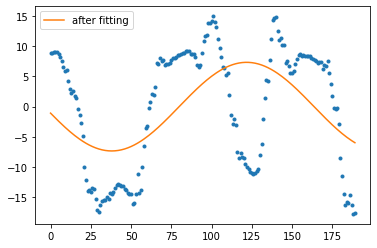

8.627038656342842
1.0
0.788263899255729


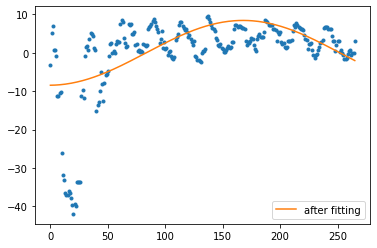

8.395101370218216
2.0
0.9062990852335516


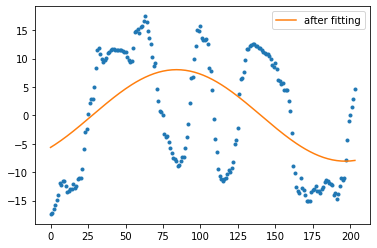

9.044729735475888
2.0
2.1358844897989058


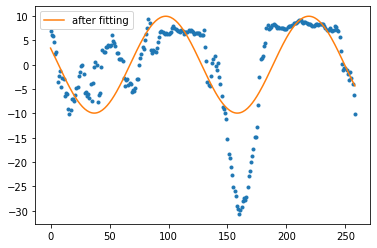

6.584455739291845
1.0
-1.1907984479955898


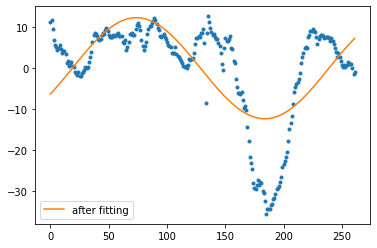

8.949359663354832
10.0
11.505576989299502


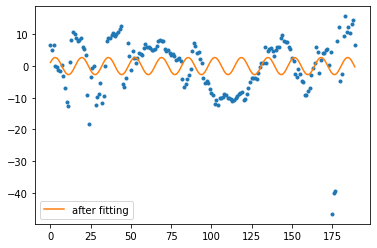

8.630053553145137
3.0
3.1489912877138253


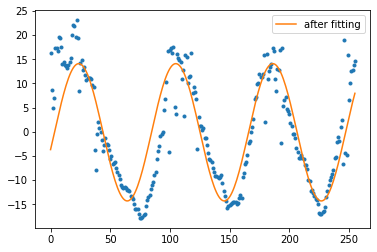

5.748314891341042
3.0
2.6194531942945694


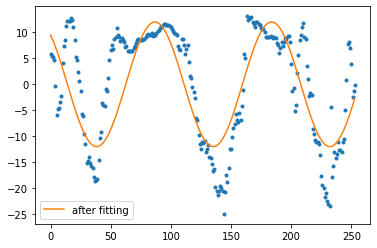

6.635240264382316
1.0
1.2019855126841623


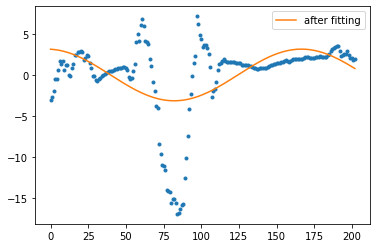

4.223251947266385
1.0
0.7756986028150005


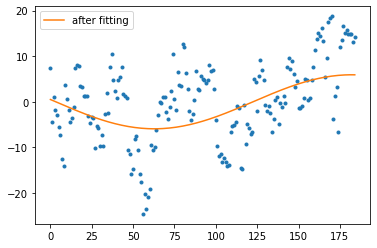

7.579277664324356
2.0
0.9203718537622655


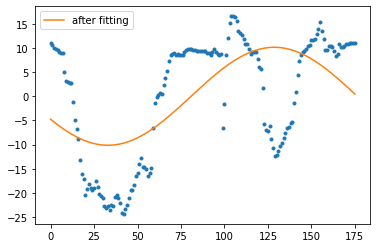

10.075384853769686
2.0
2.195458160888615


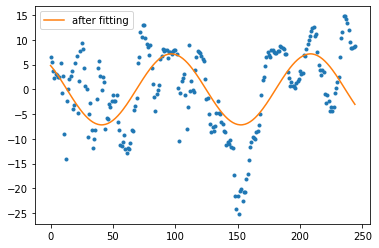

6.809028645410336
1.0
-0.8797373738732858


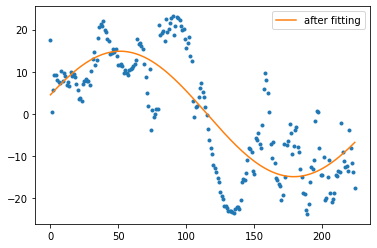

8.357403248840601
1.0
1.141104117201527


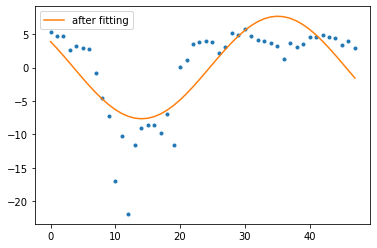

4.189405778654693
2.0
2.2991458685740214


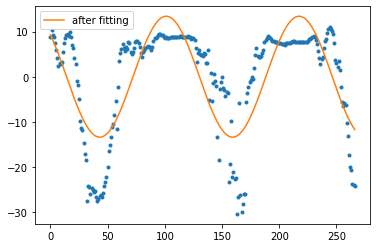

7.2800936405850525
2.0
2.2497794979433356


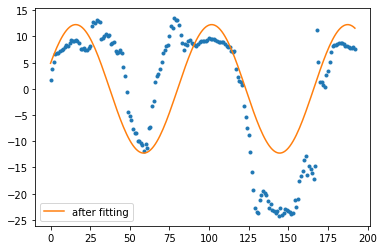

8.08531740004137
1.0
0.007001925956955056


/Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/scipy/optimize/minpack.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 1000.
  warnings.warn(errors[info][0], RuntimeWarning)


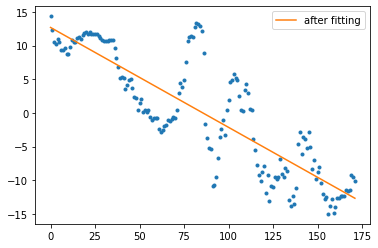

4.619873455620647
2.0
1.8351041185384356


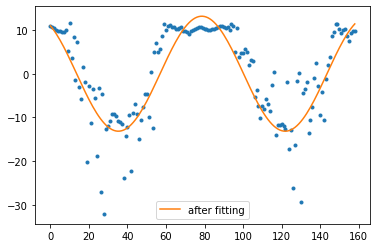

5.3631813627399225
9.0
9.307375531117923


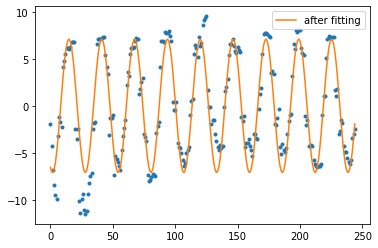

2.1227861249477384
1.0
0.9331628604976903


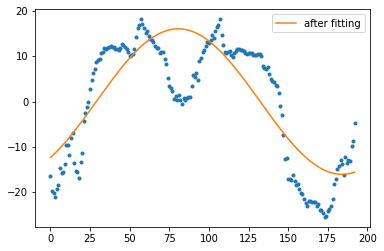

7.411169765762281
3.0
1.5614789558561242


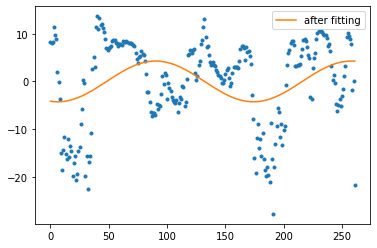

8.457199514511494


In [684]:
sigmoids_lunges = [sigmoid for name, sigmoid in sigmoids.items() if 'Lunges' in name]
print(len(sigmoids_squats))
for sigmoid in sigmoids_lunges :
    sigmoid = sigmoid[2]
    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    print(np.std(sigmoid-data_fit))
#plt.plot(freq, modul)

# Sigmoid fitting sur angles 🤘

## sans faire moyenne

49
2.0
1.9727221111203457


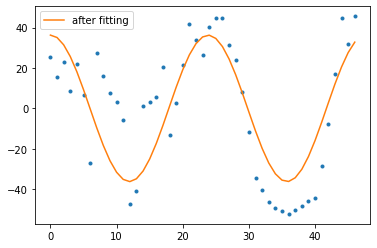

19.163266851608903
4.0
4.93942628181167


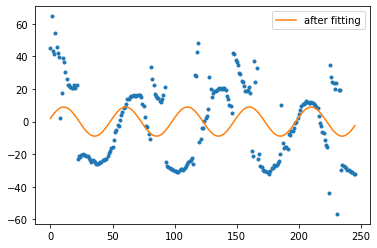

22.586569337441777
2.0
2.0008016398643247


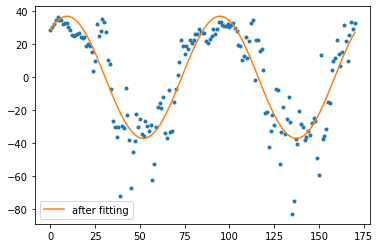

13.929913229674591
2.0
3.0240721317688037


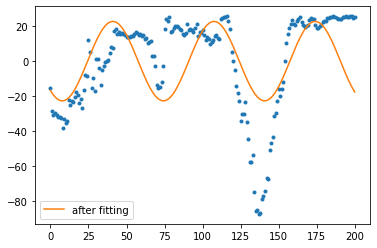

22.50320159705621
2.0
2.4311555923947603


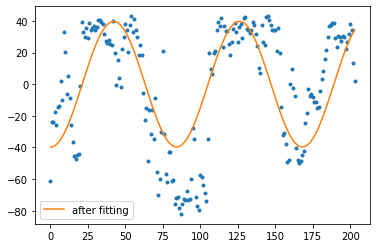

25.69302310468815
8.0
9.150491864329794


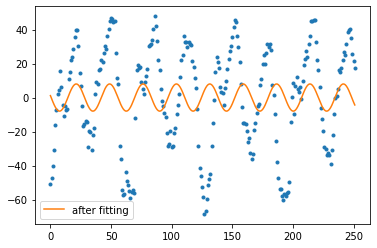

29.486058509609936
3.0
2.473962438648889


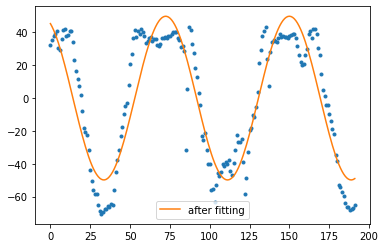

16.468189126558613
9.0
9.251662219389326


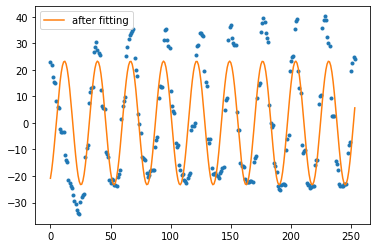

13.442760877925465
8.0
8.322299539522815


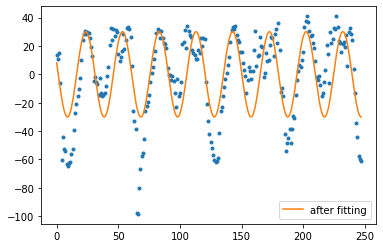

20.716453469813327
2.0
2.0688564448238624


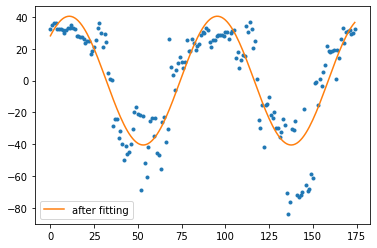

15.52039177342547
2.0
-0.0037644956825960136


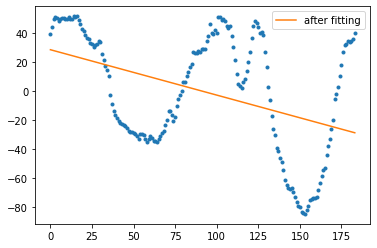

37.15818362631018
7.0
7.26753827829608


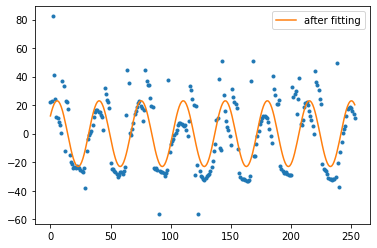

17.714445361379596
2.0
2.424377394229822


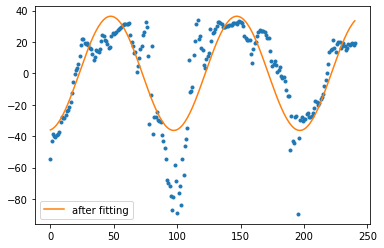

16.529883725204037
1.0
1.2343329853025304


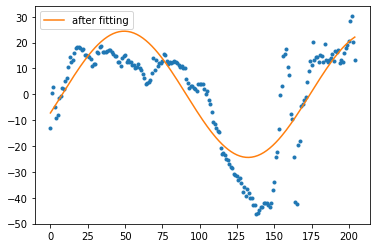

10.874673146667876
1.9999999999999998
1.9652458397961752


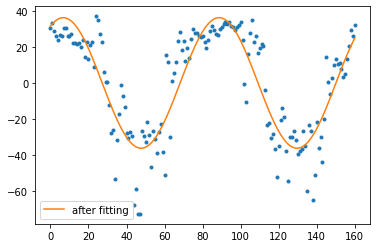

14.176364622571528
8.999999999999998
9.067222357552271


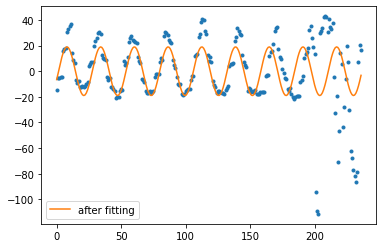

22.148526834086073
1.0
2.1138881606375284


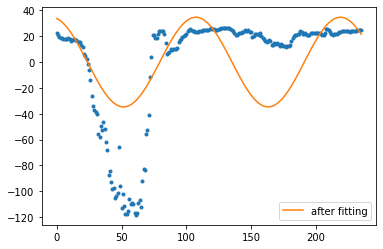

34.84446467407003
3.0
3.2553462501004926


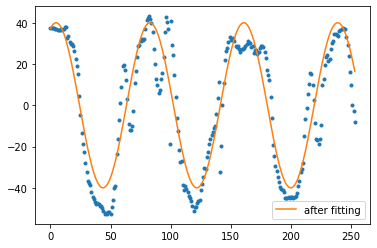

12.248997173520044
20.0
18.73993527716484


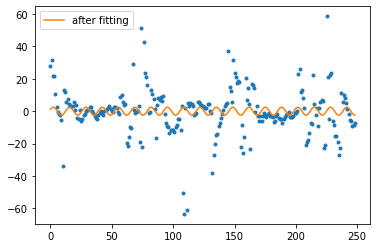

14.19668783701533
4.0
3.8546187653355086


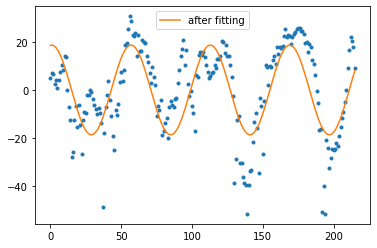

12.525473400146835
3.0
2.712039842548594


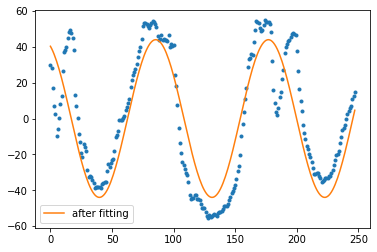

17.262331030862576
2.0
-0.004009386282660336


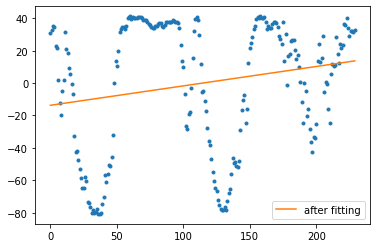

39.11709457673305
3.0
3.34304139172414


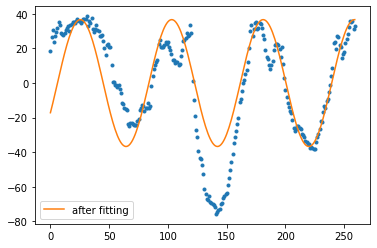

17.81505959850085
9.999999999999998
9.954127565075844


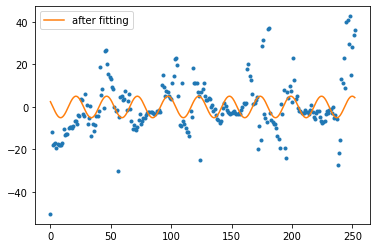

12.00486116178385
3.0000000000000004
0.9232340838405435


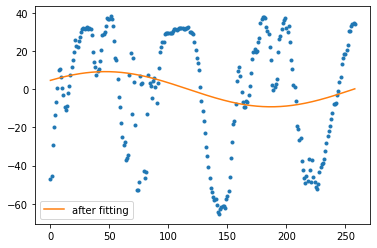

29.042712642977595
2.0
1.8733533895822754


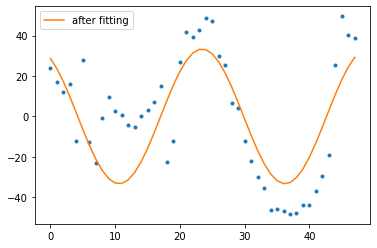

18.922338312429115
7.999999999999999
8.159401800634216


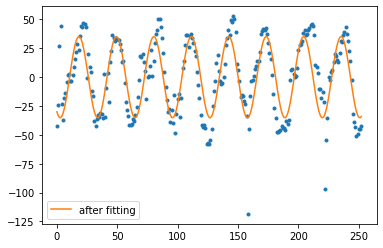

18.948856900958894
3.0
3.0227247562594144


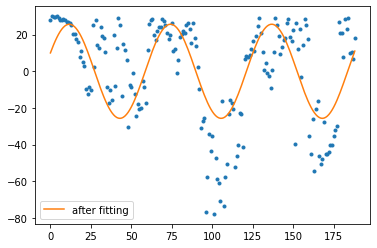

20.517767332713188
2.0
2.3454244479133997


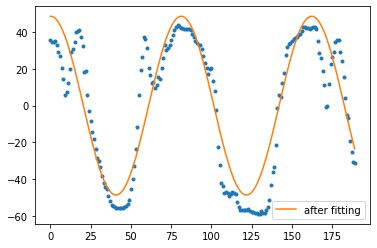

14.970307910492325
10.0
10.116722582924304


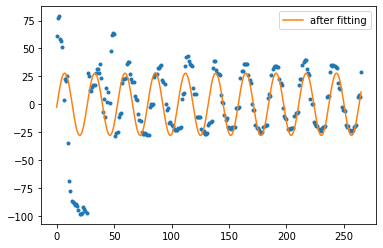

26.734792755499306
2.0
-2.2533020476859162


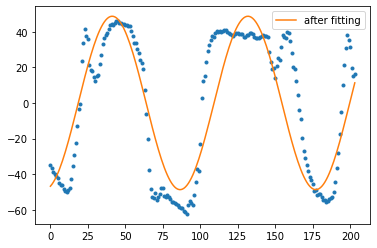

20.081382599483586
3.0000000000000004
2.757100568477036


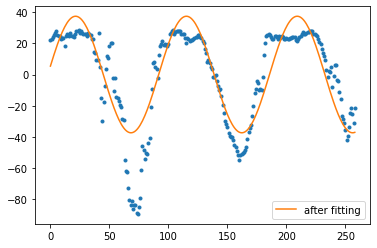

15.717798473924955
3.0
-0.8396923189823183


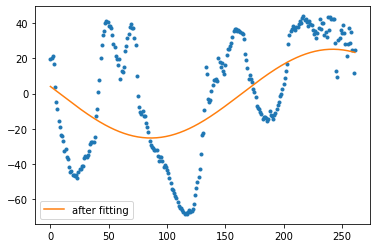

28.15977605628052
2.0
2.410817618756729


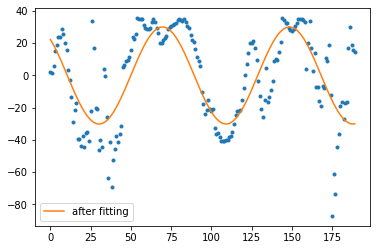

19.380135631023023
3.0
3.019853304732463


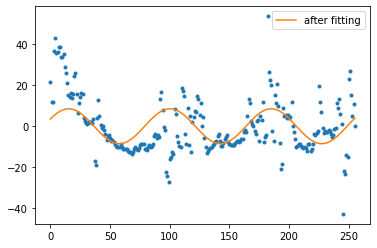

12.069218696201757
3.0
2.693187270663568


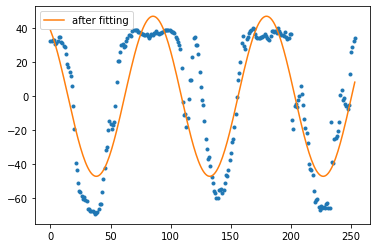

19.20767322809315
3.0
-2.9083268660317887


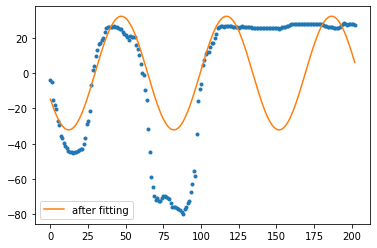

28.593018062933957
3.0
2.7326574464064946


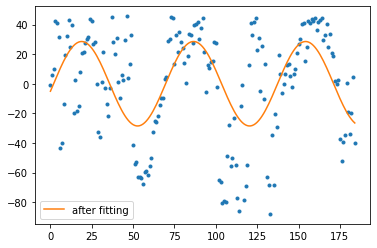

30.40767262304346
2.0
1.9221109227329563


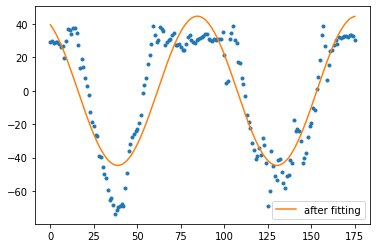

15.872985669352039
3.0000000000000004
11.555045669527614


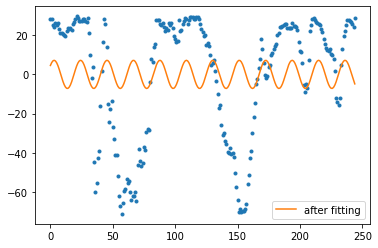

30.900968330657303
2.0
-0.7774830586760082


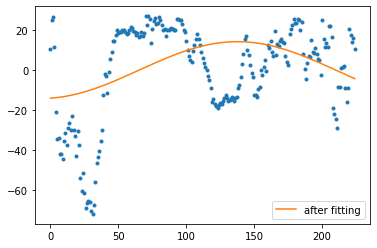

21.429029933854732
2.0
1.051905193194398


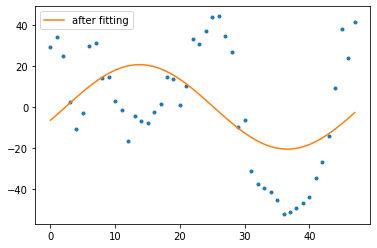

25.524835618590394
2.0
2.293200797066823


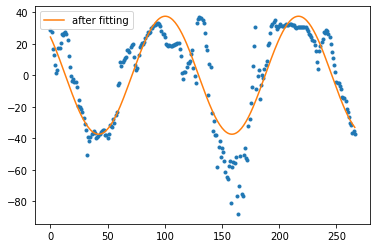

15.994963300138759
2.0
2.163027919856529


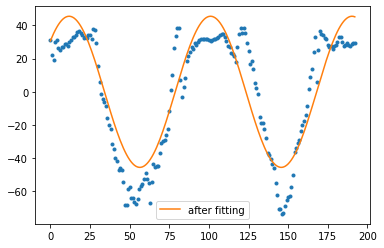

15.363625649755438
1.0
1.1671065106110292


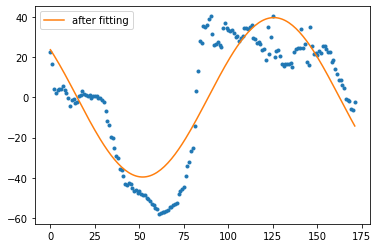

15.235331429067932
2.0
1.8146029495618439


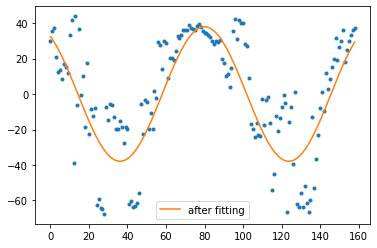

19.31199209762703
9.0
7.901357385997893


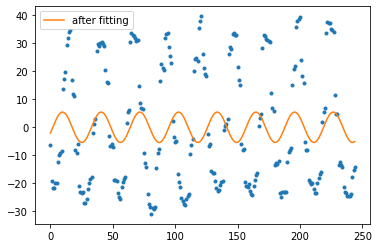

21.410981507823557
2.0
0.7013821733715897


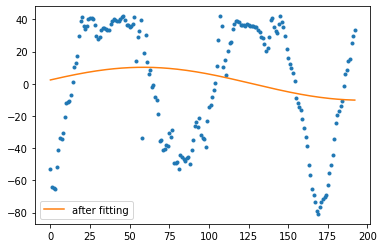

35.68448274643769
3.0
2.8806783598773524


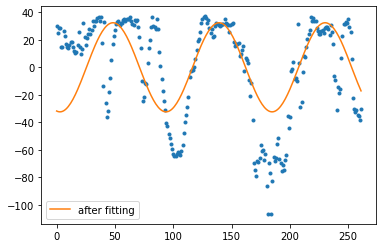

28.326434406808502


In [743]:
sigmoids_angles_lunges = [sigmoid for name, sigmoid in angles_dict.items() if 'Lunges' in name]
print(len(sigmoids_angles_lunges))
for sigmoid in sigmoids_angles_lunges :
    sigmoid = sigmoid[4]
    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    print(np.std(sigmoid-data_fit))
#plt.plot(freq, modul)

4.0


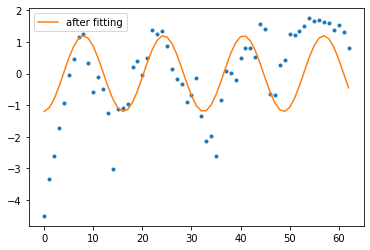

1.0982258239674512
3.0


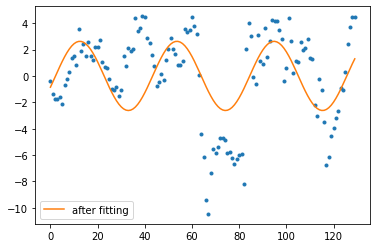

2.894035391930625
8.0


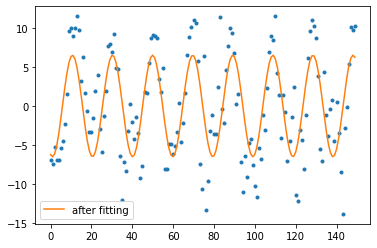

4.817125210972958
2.0


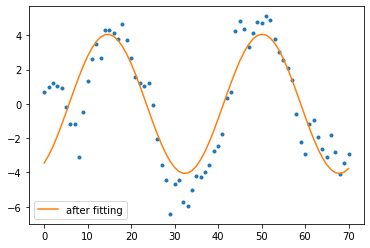

1.5755319041464424
2.0


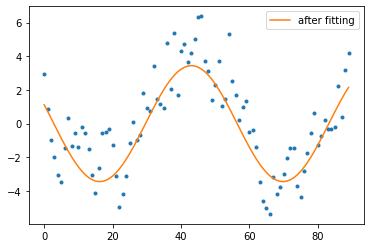

1.490240041191071
3.0


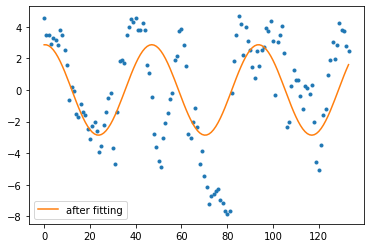

2.734246936161206
2.0


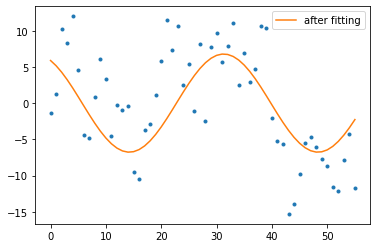

5.651232869062101
3.0


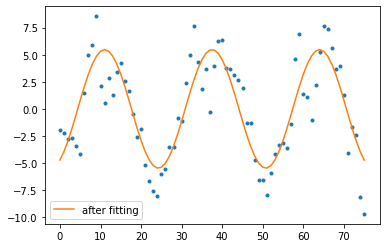

2.4109151977443215
4.0


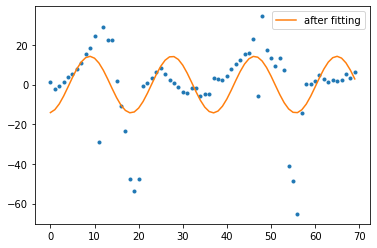

15.7235036162185
2.0


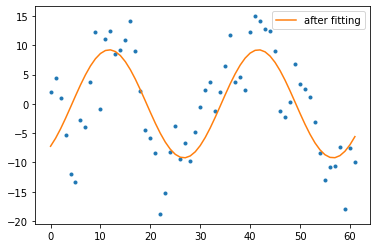

5.816777437864481
3.0


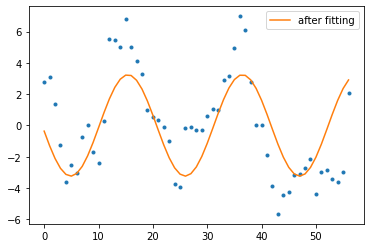

2.33435120169222
3.0


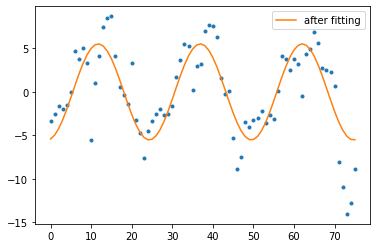

3.10686599151322
4.0


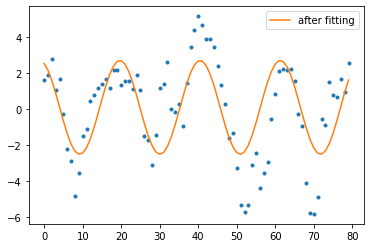

1.9445023149336957
7.0


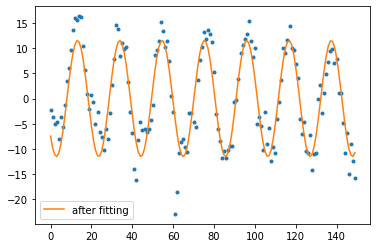

3.90930890465432
1.0


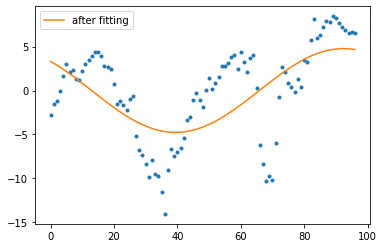

4.174848819155184
8.0


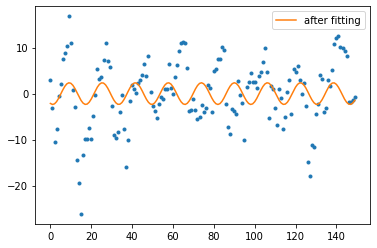

6.88203853394244
1.0


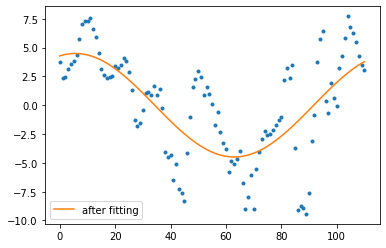

3.241480294982121
3.0


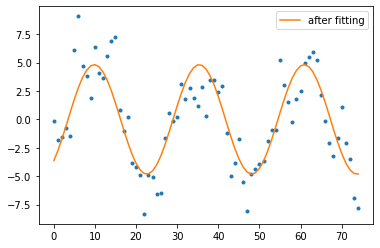

2.2410898464832507
1.0


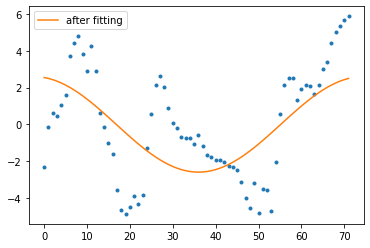

2.3768393157225534
2.0


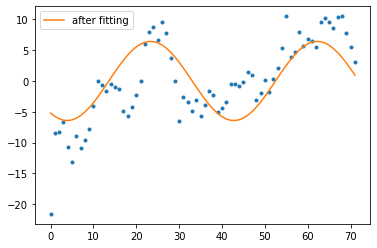

4.5887161016838425
3.0


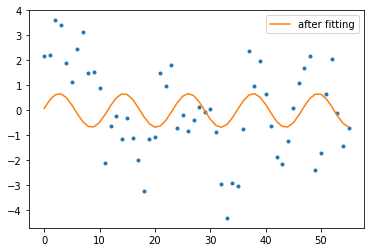

1.7488475500183442
2.0


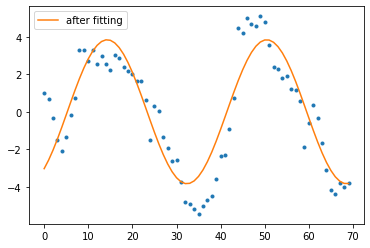

1.3494523650492594
11.0


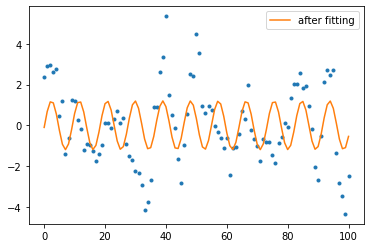

1.7094169196710518
3.0


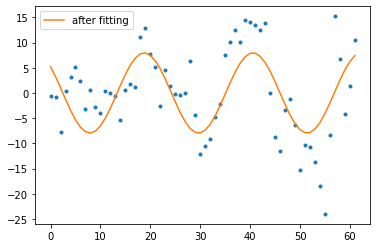

6.671071277042672
1.0


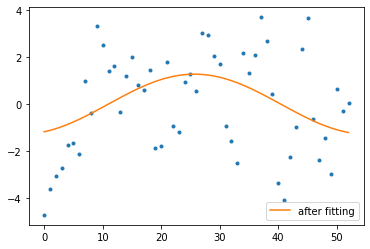

1.978293733623695
2.0


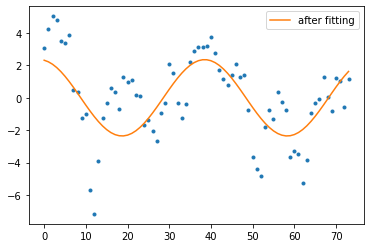

1.947417164390593
2.0


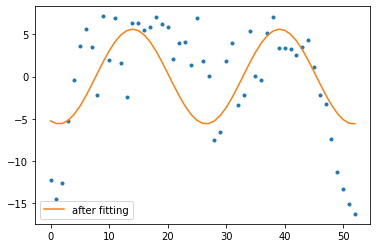

5.108484658698722
2.0


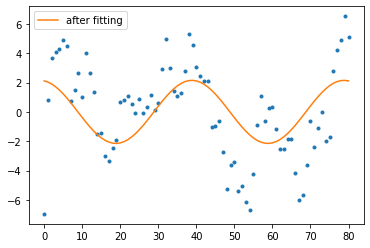

2.7872555905992105
1.0


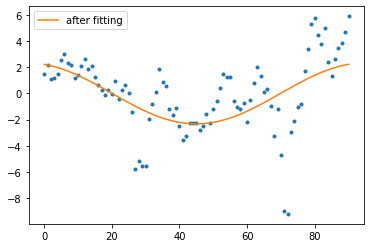

2.371929102399577
7.0


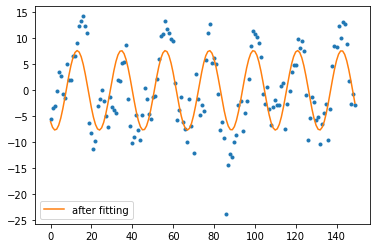

4.843629465654511
2.0


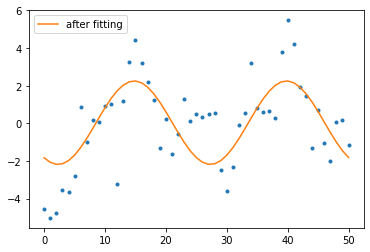

1.7637432866952396
4.0


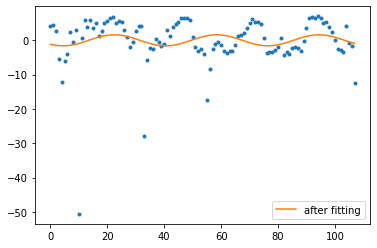

7.107094662950609
6.0


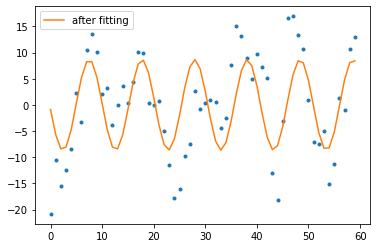

7.3029566907155425
1.0


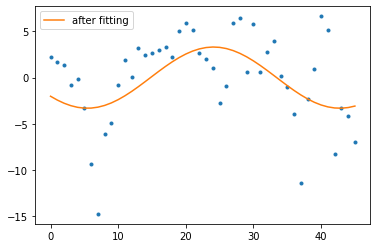

4.057002791912488
2.0


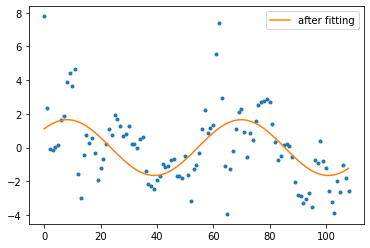

1.823054629751958
2.0


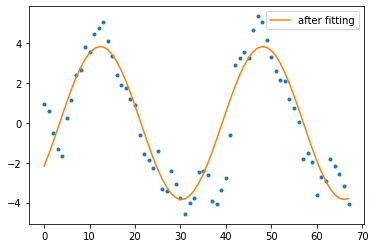

1.1957370628543285
2.0


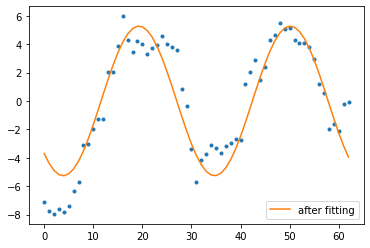

1.65019887642076
2.0


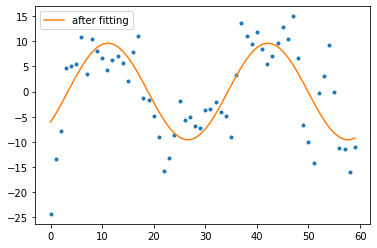

6.020241423302922
2.0


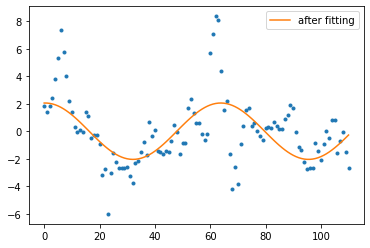

2.025071636127633
2.0


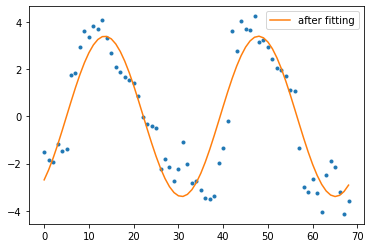

1.0243017685397515
2.0


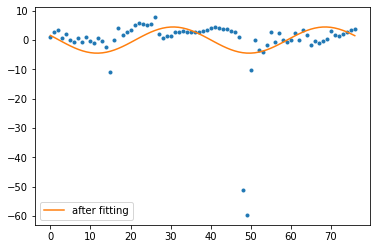

9.00219078107042
2.0


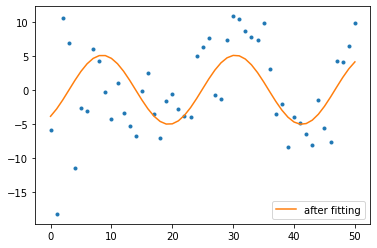

5.471606471403775
2.0


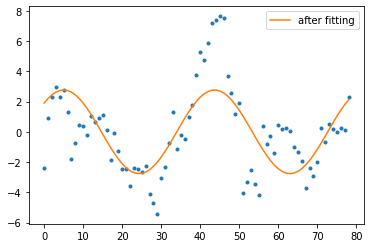

2.082259377059795


In [843]:
sigmoids_angles_pushups = [sigmoid for name, sigmoid in angles_dict.items() if 'PushUps' in name]
sigmoids_names_pushups = [name for name, sigmoid in angles_dict.items() if 'PushUps' in name]



for i,sigmoid in enumerate(sigmoids_angles_pushups) :
    sigmoid = sigmoid[5]

    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    print((np.std(sigmoid - data_fit)))
#plt.plot(freq, modul)

## moyenne des angles

In [836]:
new_data = []
for sigmoid in sigmoids_angles_pushups : # pas a faire sur video finale !
    new_sigmoid =[]
    for i in range (0,6,2) :
        mean_angles = np.mean([sigmoid[i],sigmoid[i+1]], axis=0)
        new_sigmoid.append(mean_angles)
    new_data.append(new_sigmoid)

#print(new_data[0])

43
1.0


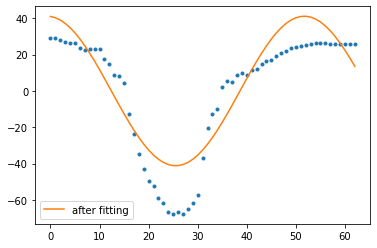

13.015547378789682
43
1.0


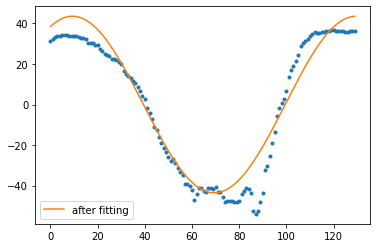

7.784315384354812
43
8.0


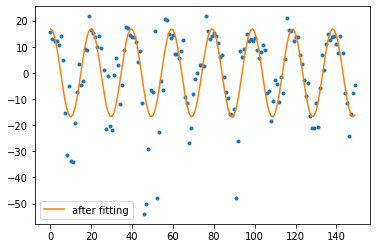

9.933395454996592
43
2.0


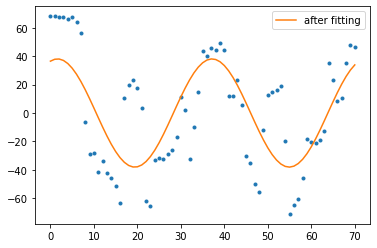

29.266428417322096
43
2.0


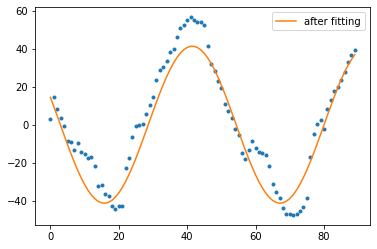

8.731386514739837
43
1.0


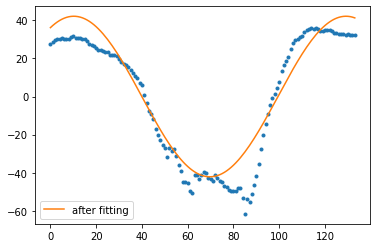

8.81503181046105
43
1.0


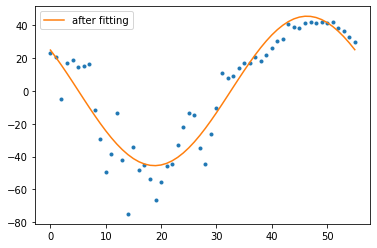

11.887961229475183
43
3.0


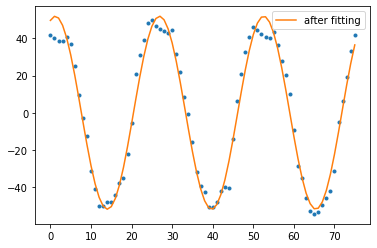

6.127901414365107
43
2.0


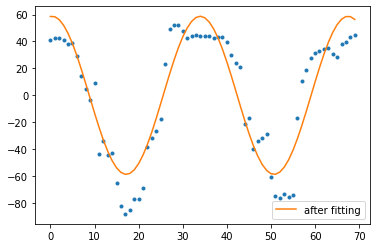

17.283729603965604
43
2.0


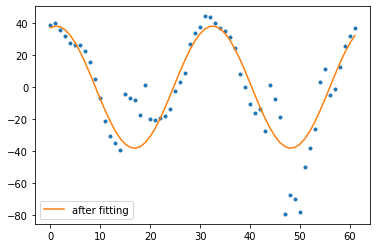

15.243409229424609
43
3.0


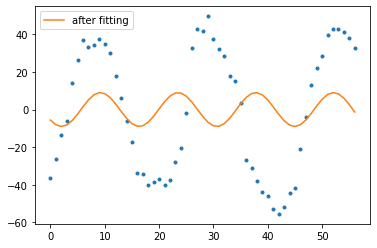

32.82267342411745
43
3.0


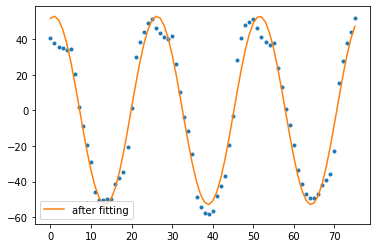

7.69388933290642
43
2.0


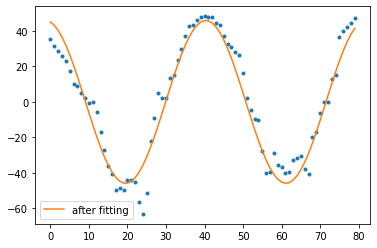

8.134687067671473
43
7.0


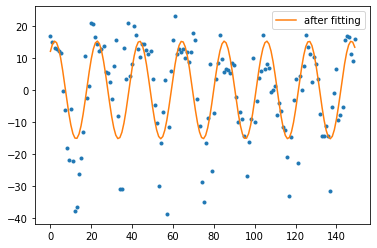

9.673307631605464
43
1.0


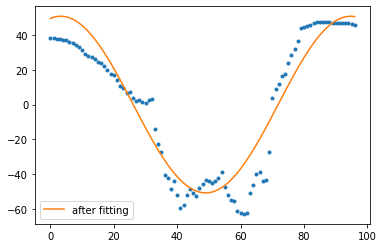

12.272228319477074
43
8.0


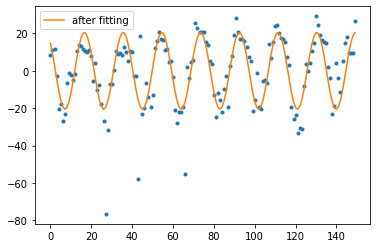

10.483327498955267
43
1.0


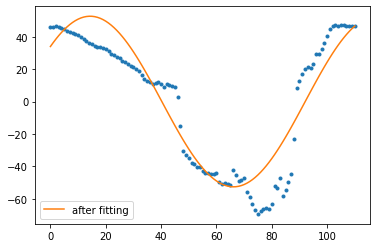

14.222495294113582
43
3.0


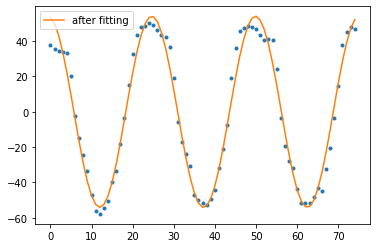

6.648709058134936
43
1.0


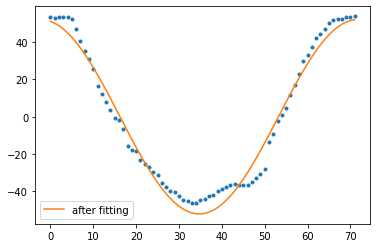

5.526675377248287
43
1.0


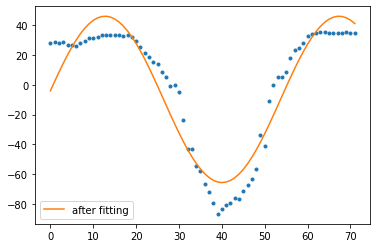

12.981445930957083
43
2.0


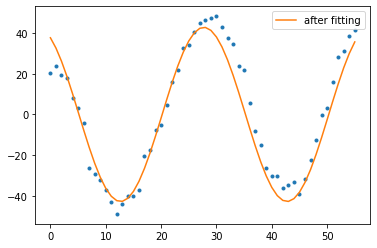

6.810077670575924
43
2.0


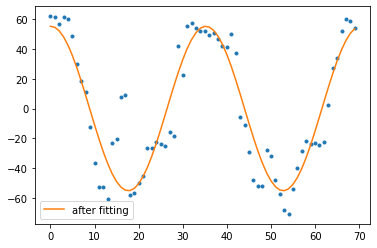

17.827821115729613
43
2.0


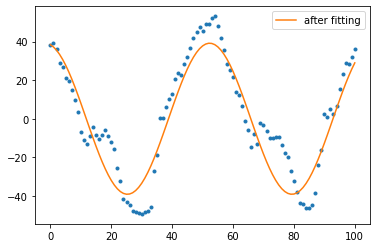

10.985812017167676
43
2.0


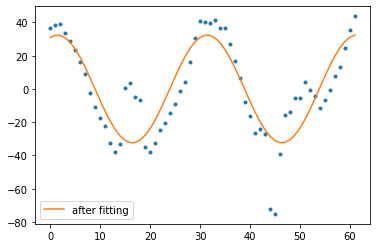

15.151827359951435
43
2.0


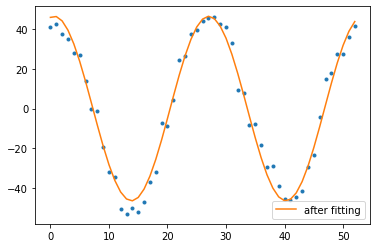

5.134147894805026
43
2.0


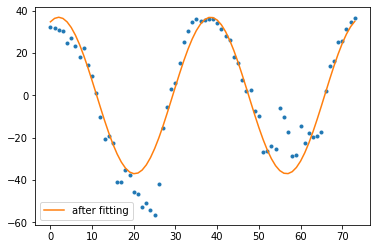

9.539339691186472
43
1.0


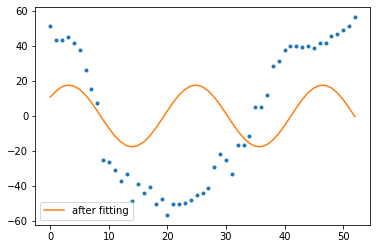

36.54866805508699
43
2.0


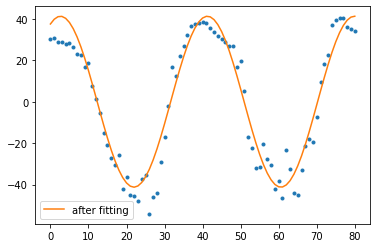

7.79329987250056
43
1.0


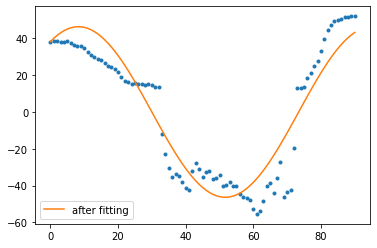

12.346286064376807
43
7.0


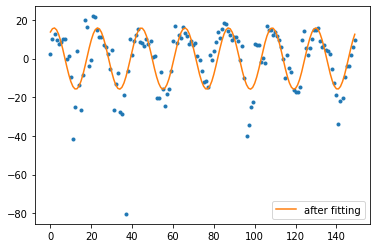

10.121648850587134
43
2.0


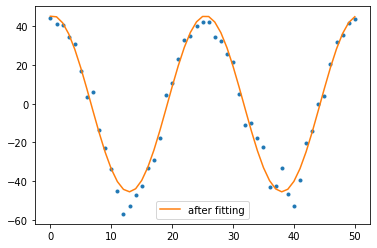

5.047209665365516
43
4.0


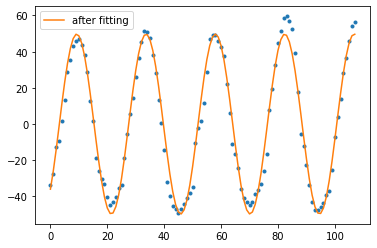

5.722888829917083
43
2.0


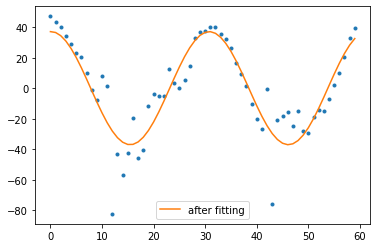

13.903203340312375
43
1.0


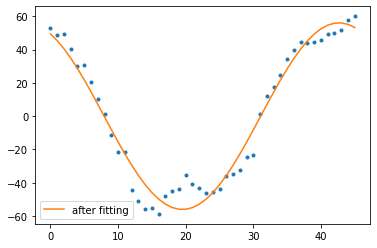

7.966480174864602
43
2.0


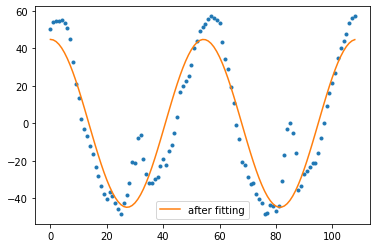

13.839006339471489
43
2.0


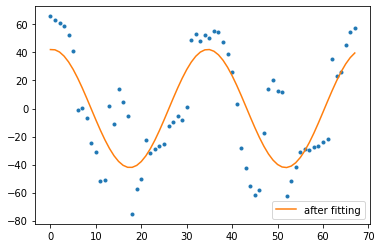

25.60547199698436
43
2.0


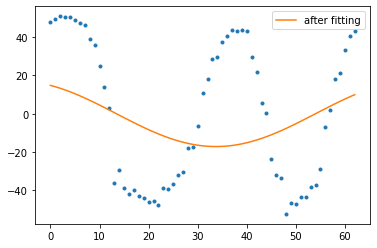

34.59910083153597
43
2.0


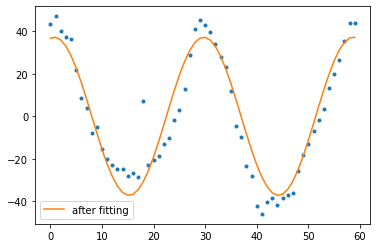

9.15746606277064
43
2.0


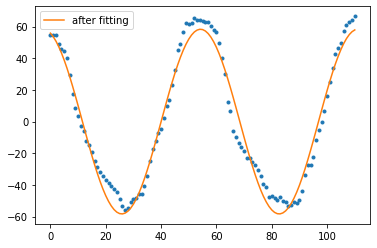

7.370758399919578
43
2.0


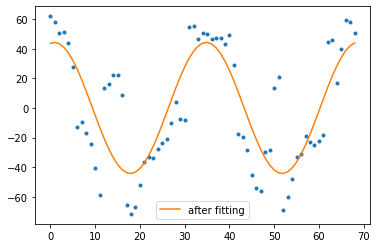

25.228784330959233
43
2.0


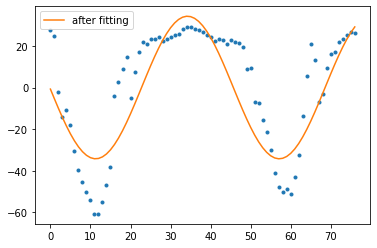

15.305135543995668
43
1.0


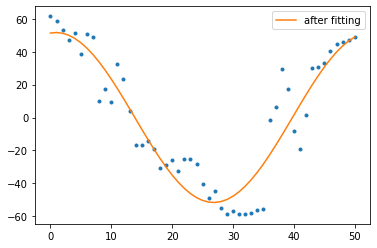

14.077522067631048
43
2.0


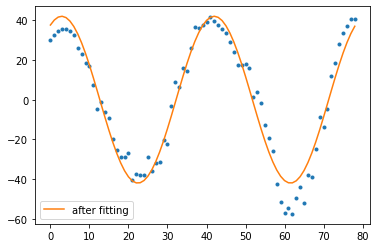

7.033351592273215


In [840]:
#sigmoids_angles_pushups = [sigmoid for name, sigmoid in angles_dict.items() if 'PushUps' in name]
#sigmoids_names_pushups = [name for name, sigmoid in angles_dict.items() if 'PushUps' in name]

sigmoids_names_pushups = [name for name, sigmoid in angles_dict.items() if 'PushUps' in name]

ecart_type_angles_pushups = {}
angles_pushups_max = []
angles_pushups_min=[]

for i,sigmoid in enumerate(new_data) :
    print(len(new_data))
    sigmoid = sigmoid[0]
    angles_pushups_max.append(max(sigmoid))
    angles_pushups_min.append(min(sigmoid))
    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    ecart_type_angles_pushups[sigmoids_names_pushups[i]] = (np.std(sigmoid - data_fit))
    print((np.std(sigmoid - data_fit)))
#plt.plot(freq, modul)

In [842]:
ecart_type_angles_pushups
#ecart_type_df = pd.DataFrame(ecart_type_angles_pushups)

{'v_PushUps_g03_c03.json': 13.015547378789682,
 'v_PushUps_g04_c04.json': 7.784315384354812,
 'v_PushUps_g05_c04.json': 9.933395454996592,
 'v_PushUps_g24_c01.json': 29.266428417322096,
 'v_PushUps_g25_c01.json': 8.731386514739837,
 'v_PushUps_g04_c05.json': 8.81503181046105,
 'v_PushUps_g10_c01.json': 11.887961229475183,
 'v_PushUps_g19_c04.json': 6.127901414365107,
 'v_PushUps_g12_c03.json': 17.283729603965604,
 'v_PushUps_g23_c01.json': 15.243409229424609,
 'v_PushUps_g22_c01.json': 32.82267342411745,
 'v_PushUps_g19_c03.json': 7.69388933290642,
 'v_PushUps_g17_c01.json': 8.134687067671473,
 'v_PushUps_g05_c02.json': 9.673307631605464,
 'v_PushUps_g04_c02.json': 12.272228319477074,
 'v_PushUps_g05_c03.json': 10.483327498955267,
 'v_PushUps_g04_c03.json': 14.222495294113582,
 'v_PushUps_g19_c02.json': 6.648709058134936,
 'v_PushUps_g03_c04.json': 5.526675377248287,
 'v_PushUps_g13_c02.json': 12.981445930957083,
 'v_PushUps_g01_c01.json': 6.810077670575924,
 'v_PushUps_g24_c04.json': 

In [841]:
angles_pushups_min

[64.99,
 77.175,
 100.5,
 27.86,
 60.83500000000001,
 72.345,
 58.92,
 72.78999999999999,
 32.489999999999995,
 47.61,
 67.655,
 65.23,
 58.075,
 112.57,
 63.065,
 73.035,
 53.78,
 65.815,
 51.83,
 51.68,
 65.515,
 32.255,
 60.315,
 53.68000000000001,
 64.89500000000001,
 75.985,
 59.58,
 79.16,
 62.85,
 75.51499999999999,
 62.8,
 65.89,
 45.665,
 48.555,
 55.605,
 25.655,
 52.725,
 79.96,
 44.870000000000005,
 29.25,
 72.84,
 45.105,
 74.6]

51
2.0


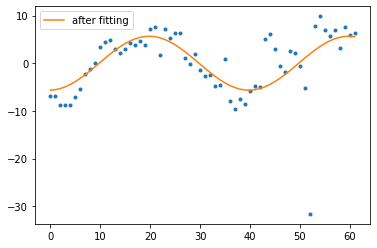

AttributeError: 'dict' object has no attribute 'append'

In [832]:
sigmoids_angles_squats = [sigmoid for name, sigmoid in angles_dict.items() if 'BodyWeightSquats' in name]
#sigmoids_names_pushups = [name for name, sigmoid in angles_dict.items() if 'PushUps' in name]

new_data = []
for sigmoid in sigmoids_angles_squats : # pas a faire sur video finale !
    new_sigmoid =[]
    for i in range (0,6,2) :
        mean_angles = np.mean([sigmoid[i],sigmoid[i+1]], axis=0)
        new_sigmoid.append(mean_angles)
    new_data.append(new_sigmoid)

print(len(new_data))


ecart_type_angles_squats = []

for sigmoid in new_data :
    sigmoid = sigmoid[0]
    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    ecart_type_angles_pushups.append(np.std(sigmoid - data_fit))
#plt.plot(freq, modul)


49
2.0


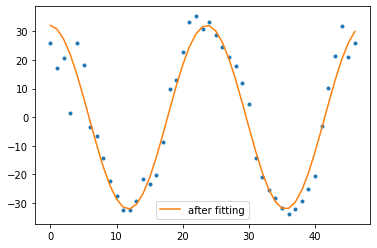

4.0


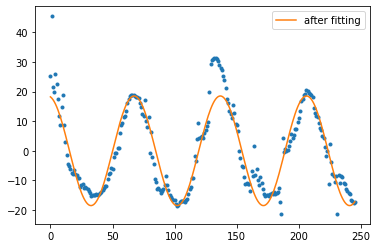

2.0


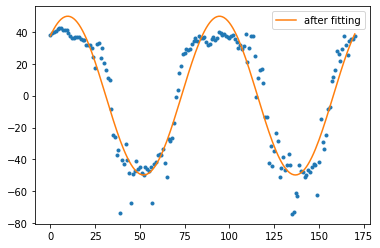

2.0


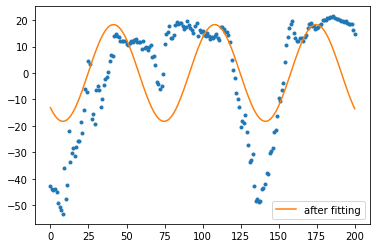

2.0


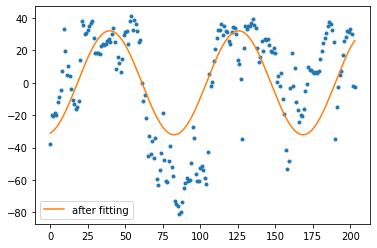

8.0


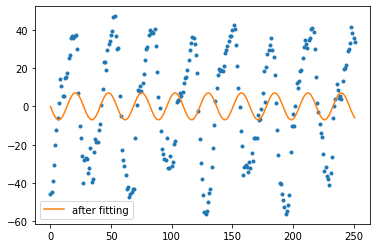

3.0


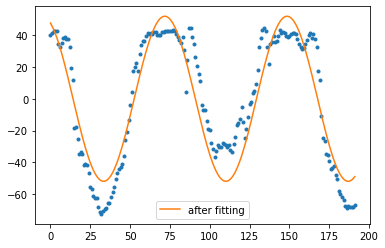

9.0


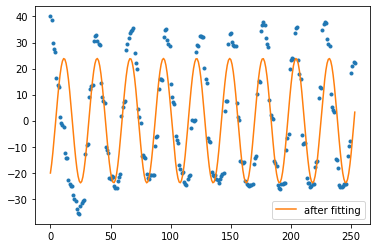

8.0


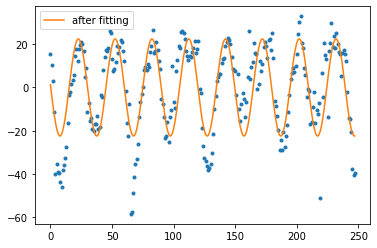

2.0


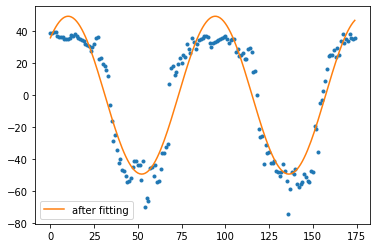

2.0


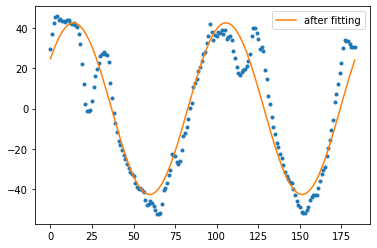

7.0


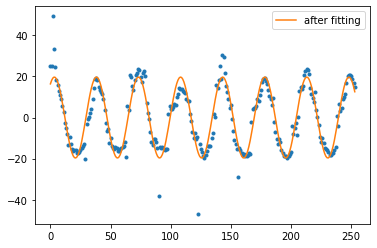

2.0


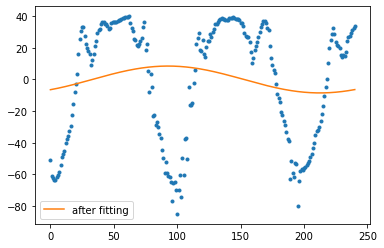

1.0


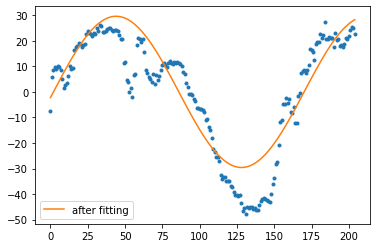

1.9999999999999998


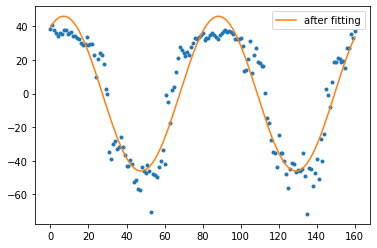

8.999999999999998


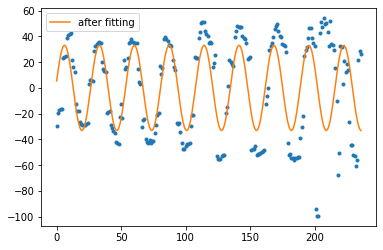

2.0


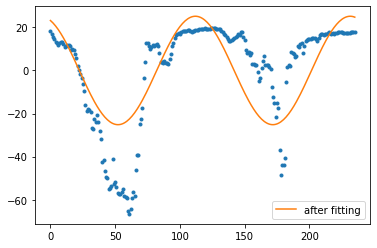

3.0


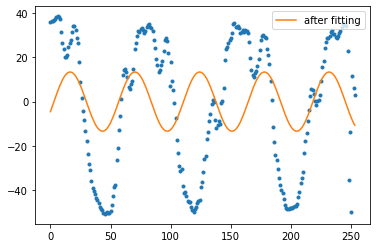

2.9999999999999996


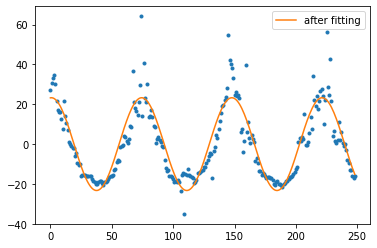

4.0


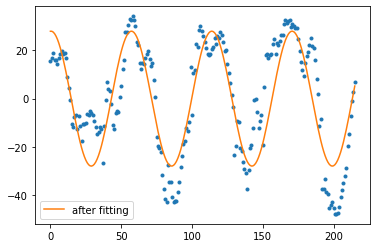

3.0


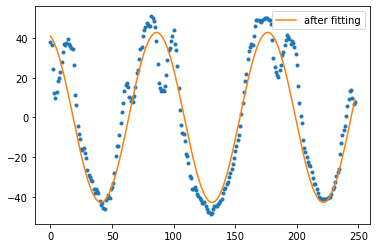

3.0000000000000004


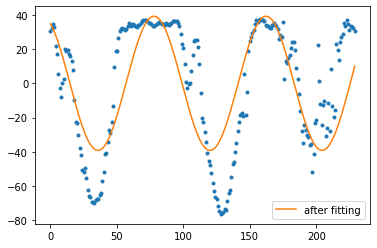

3.0


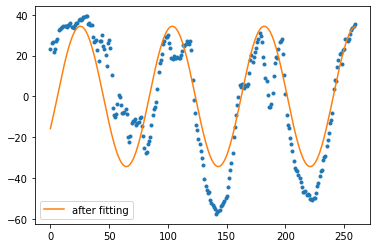

3.9999999999999996


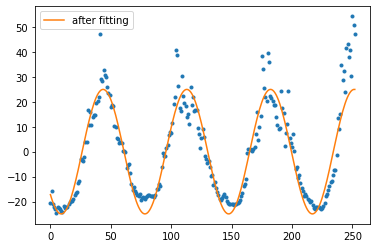

3.0000000000000004


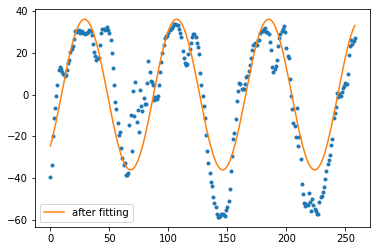

2.0


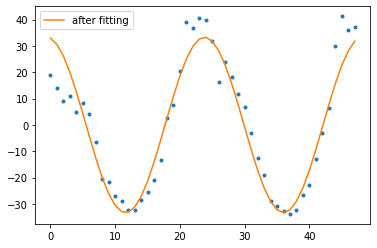

7.999999999999999


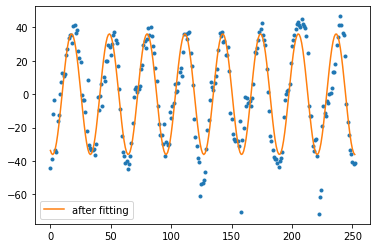

3.0


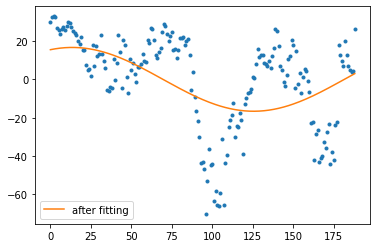

2.0


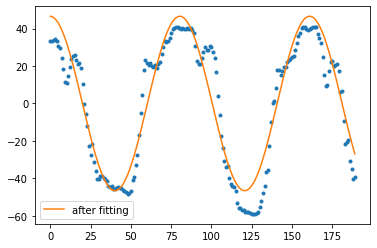

10.0


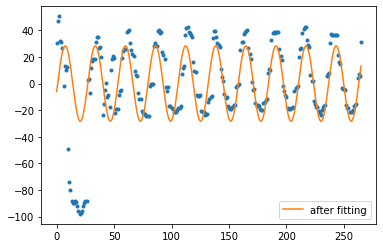

2.0


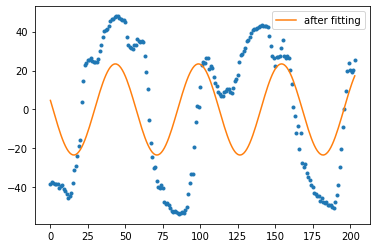

3.0000000000000004


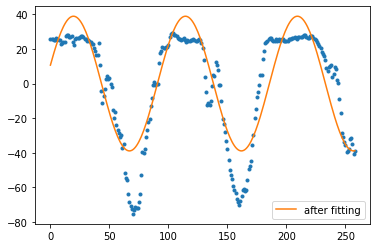

3.0


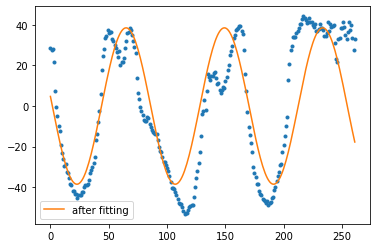

2.0


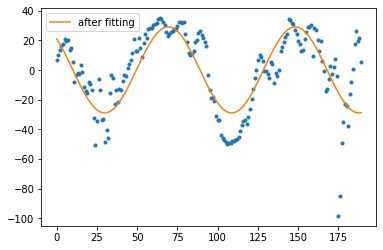

3.0


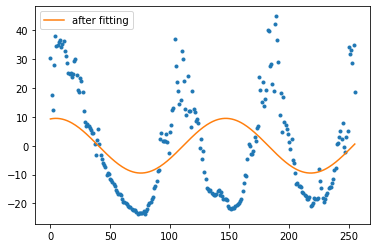

3.0


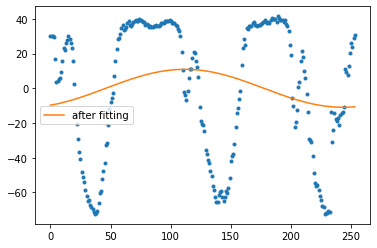

1.0


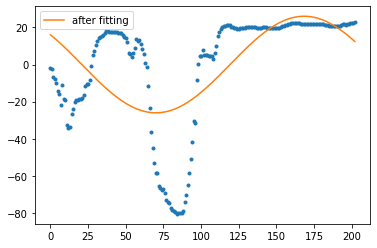

3.0


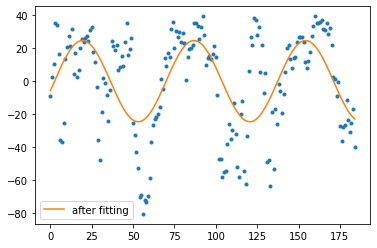

2.0


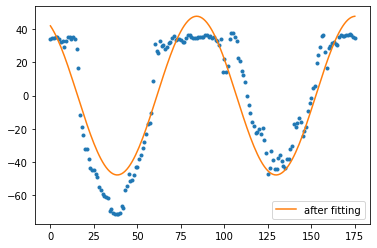

3.0000000000000004


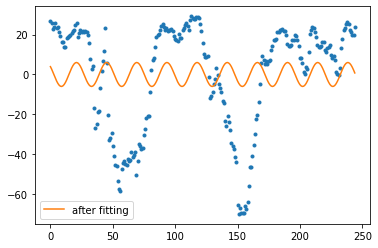

2.0


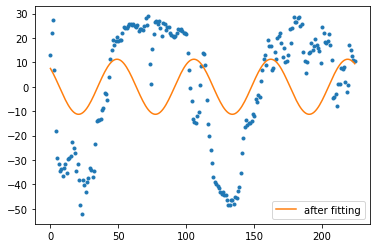

2.0


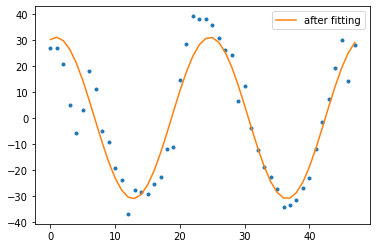

2.0


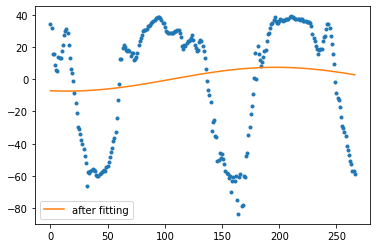

2.0


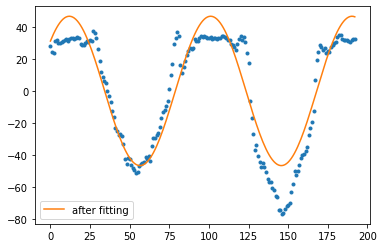

1.0


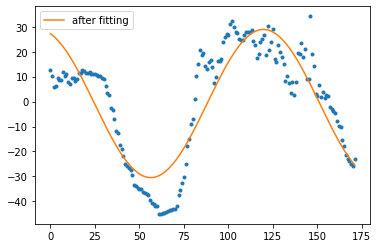

2.0


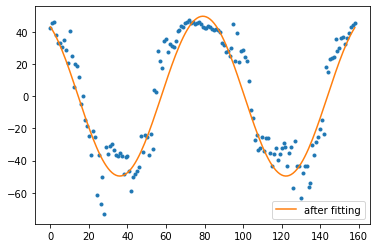

9.0


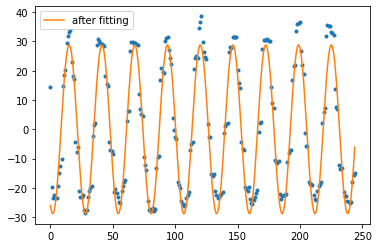

2.0


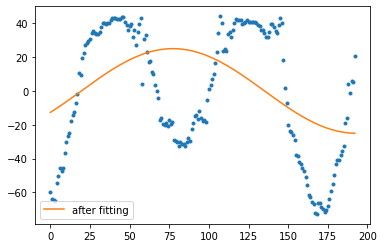

3.0


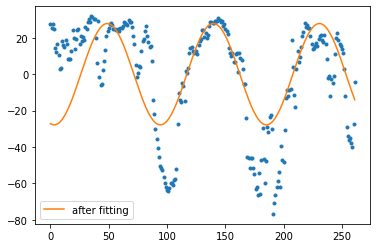

In [807]:
sigmoids_angles_lunges = [sigmoid for name, sigmoid in angles_dict.items() if 'Lunges' in name]
#sigmoids_names_pushups = [name for name, sigmoid in angles_dict.items() if 'PushUps' in name]

new_data = []
for sigmoid in sigmoids_angles_lunges : # pas a faire sur video finale !
    new_sigmoid =[]
    for i in range (0,6,2) :
        mean_angles = np.mean([sigmoid[i],sigmoid[i+1]], axis=0)
        new_sigmoid.append(mean_angles)
    new_data.append(new_sigmoid)

print(len(new_data))


ecart_type_angles_lunges = []

for sigmoid in new_data :
    sigmoid = sigmoid[2]
    amean = np.mean(sigmoid)
    sigmoid = sigmoid - amean 
    N = len(sigmoid) # number of data points
    t = np.linspace(0, N-1, N)
    
    # compte frequence par methode fft
    sp = np.fft.fft(sigmoid)
    freq = np.fft.fftfreq(t.shape[-1])
    modul = (sp.real)**2 + (sp.imag)**2
    np.argmax(modul)
    freq_data = np.abs((freq[np.argmax(modul)])*N)
    
    fine_t= t #np.linspace(0, 4*np.pi, N)
    data_fit, data_prior=my_fit(t, sigmoid, fine_t, freq_data)
    plt.plot(t, sigmoid, '.')
    #plt.plot(t, data_first_guess, label='first guess')
    plt.plot(fine_t, data_fit, label='after fitting')
    #plt.plot(fine_t, data_prior, label='before fitting')    
    plt.legend()
    plt.show()
    ecart_type_angles_lunges.append(np.std(sigmoid - data_fit))
#plt.plot(freq, modul)


In [ ]:
                #fit sigmoid on data
        fine_t= t #np.linspace(0, 4*np.pi, N)
        data_fit, data_prior=my_fit(t, angles_variation, fine_t, count)
    #plot
        #plt.plot(t, sigmoid, '.')
        #plt.plot(fine_t, data_fit, label='after fitting')
        #plt.plot(fine_t, data_prior, label='before fitting')    
        #plt.legend()
        #plt.show()
        
        #ecart type for feedback
        #ecart_type_angles_pushups.append(np.std(sigmoid - data_fit))

# fonction implementation

In [791]:
def count_repetitions(prediction, distances_array, angles_array) :
    '''prediction = exercice predicted
    distances_array = list of distances lists calculated on in each frames
    angles_array = list of angles lists calculated on in each frames
    return the numbers of the movement repetition in all the frames'''
    # calculate mean angles
    mean_angles_array=[]
    for i in range (0,6,2) :
        mean_angles = np.mean([angles_array[i],angles_array[i+1]], axis=0)
        mean_angles_array.append(mean_angles)

    # feature selection by prediction
    
    if prediction == 'pushups':         # Check prediction format !!!!
        # select angle 0 : mean left/right angle shoulders-elbows-wrists
        angles_selected = mean_angles_array[0]
        
        amean = np.mean(angles_selected)
        angles_selected = angles_selected - amean 
        N = len(angles_selected) # number of data points
        t = np.linspace(0, N-1, N)

        # movement count with fft method
        sp = np.fft.fft(angles_selected)
        freq = np.fft.fftfreq(t.shape[-1])
        modul = (sp.real)**2 + (sp.imag)**2
        np.argmax(modul)
        count = np.abs((freq[np.argmax(modul)])*N)
    
    elif prediction == 'jumpingjack':         # Check prediction format !!!!
        # select distance 6 : distance right hips right wrist
        distance_selected = distances_array[6]
        
        amean = np.mean(distance_selected)
        distance_selected = distance_selected - amean 
        N = len(distance_selected) # number of data points
        t = np.linspace(0, N-1, N)

        # movement count with fft method
        sp = np.fft.fft(distance_selected)
        freq = np.fft.fftfreq(t.shape[-1])
        modul = (sp.real)**2 + (sp.imag)**2
        np.argmax(modul)
        count = np.abs((freq[np.argmax(modul)])*N)
        
        
    elif prediction == 'squats':         # Check prediction format !!!!
        # select angle 1 : mean left/right angle shoulders-hips-knees
        angles_selected = mean_angles_array[1]
        
        amean = np.mean(angles_selected)
        angles_selected = angles_selected - amean 
        N = len(angles_selected) # number of data points
        t = np.linspace(0, N-1, N)

        # movement count with fft method
        sp = np.fft.fft(angles_selected)
        freq = np.fft.fftfreq(t.shape[-1])
        modul = (sp.real)**2 + (sp.imag)**2
        np.argmax(modul)
        count = np.abs((freq[np.argmax(modul)])*N)
        
    elif prediction == 'lunges':         # Check prediction format !!!!
        # select angle 1 : mean left/right angle hips-knees-hankles
        angles_selected = mean_angles_array[2]
        
        amean = np.mean(angles_selected)
        angles_selected = angles_selected - amean 
        N = len(angles_selected) # number of data points
        t = np.linspace(0, N-1, N)

        # movement count with fft method
        sp = np.fft.fft(angles_selected)
        freq = np.fft.fftfreq(t.shape[-1])
        modul = (sp.real)**2 + (sp.imag)**2
        np.argmax(modul)
        count = np.abs((freq[np.argmax(modul)])*N)

        return count


In [ ]:
def feedback(prediction, distances_array, angles_array) :
    
    # calculate mean angles
    mean_angles_array=[]
    for i in range (0,6,2) :
        mean_angles = np.mean([angles_array[i],angles_array[i+1]], axis=0)
        mean_angles_array.append(mean_angles)

    # feature selection by prediction
    
    if prediction == 'pushups':         # Check prediction format !!!!
        # select angle 0 : mean left/right angle shoulders-elbows-wrists
        angles_selected = mean_angles_array[0]
        
        amean = np.mean(angles_selected)
        angles_selected = angles_selected - amean 
        N = len(angles_selected) # number of data points
        t = np.linspace(0, N-1, N)

        # movement count with fft method
        sp = np.fft.fft(angles_selected)
        freq = np.fft.fftfreq(t.shape[-1])
        modul = (sp.real)**2 + (sp.imag)**2
        np.argmax(modul)
        count = np.abs((freq[np.argmax(modul)])*N)
        
        #fit sigmoid on data
        fine_t= t #np.linspace(0, 4*np.pi, N)
        data_fit, data_prior=my_fit(t, angles_variation, fine_t, count)
        
        
        
        
        
        
        
    
    elif prediction == 'jumpingjack':         # Check prediction format !!!!
        # select distance 6 : distance right hips right wrist
        distance_selected = distances_array[6]
        
        amean = np.mean(distance_selected)
        distance_selected = distance_selected - amean 
        N = len(distance_selected) # number of data points
        t = np.linspace(0, N-1, N)

        # movement count with fft method
        sp = np.fft.fft(distance_selected)
        freq = np.fft.fftfreq(t.shape[-1])
        modul = (sp.real)**2 + (sp.imag)**2
        np.argmax(modul)
        count = np.abs((freq[np.argmax(modul)])*N)
        
        
    elif prediction == 'squats':         # Check prediction format !!!!
        # select angle 1 : mean left/right angle shoulders-hips-knees
        angles_selected = mean_angles_array[1]
        
        amean = np.mean(angles_selected)
        angles_selected = angles_selected - amean 
        N = len(angles_selected) # number of data points
        t = np.linspace(0, N-1, N)

        # movement count with fft method
        sp = np.fft.fft(angles_selected)
        freq = np.fft.fftfreq(t.shape[-1])
        modul = (sp.real)**2 + (sp.imag)**2
        np.argmax(modul)
        count = np.abs((freq[np.argmax(modul)])*N)
        
    elif prediction == 'lunges':         # Check prediction format !!!!
        # select angle 1 : mean left/right angle hips-knees-hankles
        angles_selected = mean_angles_array[2]
        
        amean = np.mean(angles_selected)
        angles_selected = angles_selected - amean 
        N = len(angles_selected) # number of data points
        t = np.linspace(0, N-1, N)

        # movement count with fft method
        sp = np.fft.fft(angles_selected)
        freq = np.fft.fftfreq(t.shape[-1])
        modul = (sp.real)**2 + (sp.imag)**2
        np.argmax(modul)
        count = np.abs((freq[np.argmax(modul)])*N)

        return count


# Scaling

In [433]:
X = df.drop(columns=['class', 'delta_d6', 'delta_d7']).copy()
y = df['class'].copy()

KeyError: "['delta_d6' 'delta_d7'] not found in axis"

In [434]:
#from sklearn.preprocessing import StandardScaler
scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

In [435]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2)

In [410]:
X_train.shape

(184, 24)

# KNN 🤘

In [411]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

model_KNN = KNeighborsClassifier()

k_range = list(range(5, 30))

param_grid_KNN = dict(n_neighbors=k_range)
search_KNN = GridSearchCV(model_KNN, param_grid_KNN, cv=10, scoring='accuracy', n_jobs = -1)
search_KNN.fit(X_train, y_train)
# Best score
search_KNN.best_score_

0.9619883040935673

In [413]:
y_real = tests_df['class']
X_real = tests_df.drop(columns=['class', 'filename', 'delta_d6', 'delta_d7'])
#print(nos_tests)
X_real_scaled = scaler.transform(X_real)

y_pred_KNN = search_KNN.predict(X_real_scaled)

res = accuracy_score(y_real, y_pred_KNN)
results = pd.DataFrame({'real': y_real, 'pred': y_pred_KNN, 'filename': tests_df['filename']})
print(res)
results.sort_values('real')

0.7758620689655172


,real,pred,filename
43,0,0,PushUps_16.json
15,0,0,PushUps_3.json
20,0,0,PushUps_15.json
22,0,0,PushUps_4.json
39,0,0,PushUps_7.json
9,0,0,PushUps_12.json
49,0,0,PushUps_11.json
47,0,0,PushUps_0.json
36,0,0,PushUps_6.json
29,0,0,PushUps_14.json


# SVM 🙌

In [414]:

from sklearn.svm import SVC

model_svc = SVC()

param_grid_svc = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf', 'poly', 'sigmoid']} 
  
search_svc = GridSearchCV(model_svc, param_grid_svc,  n_jobs=-1)
  
# fitting the model for grid search
search_svc.fit(X_train, y_train)
# Best score
search_svc.best_score_


0.9672672672672673

In [415]:
y_pred_svc = search_svc.predict(X_real_scaled)

res = accuracy_score(y_real, y_pred_svc)
results = pd.DataFrame({'real': y_real, 'pred': y_pred_svc, 'filename': tests_df['filename']})
print(res)
results[results['real']!=results['pred']]

0.896551724137931


,real,pred,filename
0,3,2,Lunges_7.json
8,2,3,BodyWeightSquats_9.json
21,3,2,Lunges_1.json
38,3,2,Lunges_2.json
51,3,2,Lunges_9.json
57,2,1,BodyWeightSquats_7.json


# Deep learning 🙈🙉🙊

In [86]:
X_train.shape
y_cat.shape

(39, 3)

In [87]:
from tensorflow.keras.utils import to_categorical
y_cat = to_categorical(y_train, num_classes=3)
#X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_cat, test_size=0.3)

# model creation
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import models


mymodel_deep = Sequential()
mymodel_deep.add(layers.Dense(500, activation='relu', input_dim=X_train.shape[1]))
mymodel_deep.add(layers.Dense(350, activation='relu'))
mymodel_deep.add(layers.Dropout(rate=0.3))
mymodel_deep.add(layers.Dense(250, activation='relu'))
mymodel_deep.add(layers.Dropout(rate=0.4))
mymodel_deep.add(layers.Dense(125, activation='relu'))
mymodel_deep.add(layers.Dropout(rate=0.5))

mymodel_deep.add(layers.Dense(3, activation='softmax'))


In [92]:
#entrainement

es = EarlyStopping(patience=10, restore_best_weights=True, monitor = 'val_accuracy')

mymodel_deep.compile(
    optimizer='adam',
    loss='categorical_crossentropy', 
    metrics = ['accuracy', 'Precision'])

history = mymodel_deep.fit(X_train, y_cat, batch_size=8, epochs=400, validation_split=0.2,callbacks=[es])

Epoch 1/400
 1/16 [>.............................] - ETA: 6s - loss: 0.0360 - accuracy: 1.0000 - precision: 1.0000

2021-09-07 22:04:38.280621: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


16/16 [==============================] - 1s 30ms/step - loss: 0.1330 - accuracy: 0.9431 - precision: 0.9431 - val_loss: 0.0088 - val_accuracy: 1.0000 - val_precision: 1.0000
Epoch 2/400
 5/16 [========>.....................] - ETA: 0s - loss: 0.1084 - accuracy: 0.9750 - precision: 0.9750

2021-09-07 22:04:38.763317: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


16/16 [==============================] - 0s 17ms/step - loss: 0.1384 - accuracy: 0.9593 - precision: 0.9593 - val_loss: 0.0110 - val_accuracy: 1.0000 - val_precision: 1.0000
Epoch 3/400
16/16 [==============================] - 0s 16ms/step - loss: 0.0615 - accuracy: 0.9919 - precision: 0.9919 - val_loss: 0.0190 - val_accuracy: 1.0000 - val_precision: 1.0000
Epoch 4/400
16/16 [==============================] - 0s 16ms/step - loss: 0.0487 - accuracy: 0.9919 - precision: 0.9919 - val_loss: 0.0051 - val_accuracy: 1.0000 - val_precision: 1.0000
Epoch 5/400
16/16 [==============================] - 0s 16ms/step - loss: 0.0336 - accuracy: 0.9919 - precision: 0.9919 - val_loss: 0.0086 - val_accuracy: 1.0000 - val_precision: 1.0000
Epoch 6/400
16/16 [==============================] - 0s 16ms/step - loss: 0.0069 - accuracy: 1.0000 - precision: 1.0000 - val_loss: 9.5024e-04 - val_accuracy: 1.0000 - val_precision: 1.0000
Epoch 7/400
16/16 [==============================] - 0s 16ms/step - loss: 0.06

In [94]:
# evaluate
y_real = to_categorical(y_real)
res_deep = mymodel_deep.evaluate(X_real_scaled, y_real)

test_accuracy_deep = res_deep[1]



ValueError: in user code:

    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:1323 test_function  *
        return step_function(self, iterator)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:1314 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/distribute/distribute_lib.py:1285 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/distribute/distribute_lib.py:2833 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/distribute/distribute_lib.py:3608 _call_for_each_replica
        return fn(*args, **kwargs)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:1307 run_step  **
        outputs = model.test_step(data)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:1268 test_step
        self.compiled_loss(
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/keras/engine/compile_utils.py:204 __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/keras/losses.py:155 __call__
        losses = call_fn(y_true, y_pred)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/keras/losses.py:259 call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/util/dispatch.py:206 wrapper
        return target(*args, **kwargs)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/keras/losses.py:1643 categorical_crossentropy
        return backend.categorical_crossentropy(
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/util/dispatch.py:206 wrapper
        return target(*args, **kwargs)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/keras/backend.py:4862 categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)
    /Users/maximedupouy/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/tensorflow/python/framework/tensor_shape.py:1161 assert_is_compatible_with
        raise ValueError("Shapes %s and %s are incompatible" % (self, other))

    ValueError: Shapes (None, 3, 2, 2) and (None, 3) are incompatible


In [90]:
# learning curves
def plot_history(history, title='', axs=None, exp_name=""):
    if axs is not None:
        ax1, ax2 = axs
    else:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    if len(exp_name) > 0 and exp_name[0] != '_':
        exp_name = '_' + exp_name
    ax1.plot(history.history['loss'], label='train' + exp_name)
    ax1.plot(history.history['val_loss'], label='val' + exp_name)
    #ax1.set_ylim(0., 2.2)
    ax1.set_title('loss')
    ax1.legend()

    ax2.plot(history.history['accuracy'], label='train accuracy'  + exp_name)
    ax2.plot(history.history['val_accuracy'], label='val accuracy'  + exp_name)
    #ax2.set_ylim(0.25, 1.)
    ax2.set_title('Accuracy')
    ax2.legend()
    return (ax1, ax2)

(<AxesSubplot:title={'center':'loss'}>,
 <AxesSubplot:title={'center':'Accuracy'}>)

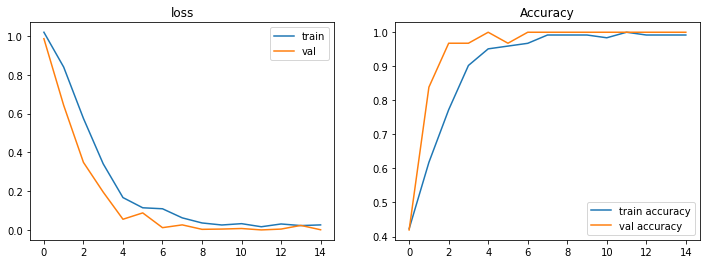

In [91]:
plot_history(history)

In [ ]:
#y_deep = mymodel_deep.predict(nos_tests_scaled)
y_cat = to_categorical(y_real, num_classes=1)
mymodel_deep.evaluate(nos_tests_scaled, y_cat)

In [ ]:
model = LinearSVC(C=10, max_iter=100000)

scores = cross_val_score(model, X_scaled, y, scoring='accuracy', cv=5, verbose=1)

In [ ]:
scores.mean()

In [ ]:
model.fit(X_scaled, y)

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred)

In [ ]:
X_test2 = tests_df.drop(columns=['class']).copy()
X_test2_scaled = scaler.transform(X_test2)
y_test2 = tests_df['class'].copy()

In [ ]:
y_pred2 = model.predict(X_test2_scaled)

In [ ]:
accuracy_score(y_test2, y_pred2)

In [ ]:
pd.DataFrame({'real':y_test2, 'predicted':y_pred2})

In [ ]:
neigh = KNeighborsClassifier(n_neighbors=5)
neigh.fit(X_scaled, y)

In [ ]:
y_pred2 = neigh.predict(X_test2_scaled)

In [ ]:
accuracy_score(y_test2, y_pred2)

In [ ]:
svc = SVC(C=100)
svc.fit(X_scaled, y)

In [ ]:
y_pred2 = svc.predict(X_test2_scaled)

In [ ]:
accuracy_score(y_test2, y_pred2)